# ⚕️Breast Cancer Data
## Tasks:

### 1. Image Segmentation with UNet
### 2. Image Classification with VGG16, VGG19, EfficientNet (Transfer Learning and Fine-tuning)
### 3. Image Compression and Reconstruction with AutoEncoder
### 4. Image Generation with Deep Convolutional Generative Adversarial Networks (DCGAN)


## **📚 Importing Important Libraries for Data Preprocessing, Model Building using Pytorch, and Evaluation**


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import random
%matplotlib inline
from tqdm.notebook import tqdm
from IPython.display import Image
from collections import Counter
import shutil

from torchvision.utils import make_grid
import torchvision.models as models
import torch.nn.functional as F
from torchvision.utils import save_image
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import torch
import torch.optim as optim
from PIL import Image
import cv2
import torch.nn as nn
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")

import glob

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## **📝 Configs for the Whole Project**

In [11]:
TEST_SPLIT = 0.25
RANDOM_SEED = 42

IMAGE_SIZE_SEG = 256
BATCH_SIZE_SEG = 8
LR_SEG = 0.0001
WEIGHT_DECAY = 1e-6 
NUM_EPOCH_SEG = 40

IMAGE_SIZE_CLS = 128
TEST_SIZE_CLS = 0.3
VAL_SIZE_CLS = 0.5
NUM_EPOCH_CLS = 10


IMAGE_SIZE_GAN = 64
BATCH_SIZE_GAN = 32
NUM_EPOCHS_GAN = 150
LR_GAN = 0.0002
LATENT_SIZE = 128

IMAGE_SIZE_AE = 128
WIGHT_DECAY_AE = 1e-5
NUM_EPOCH_AE = 100


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

## **☄️ Create One Mask for Images With Two Masks**

In [6]:
src_path = "/kaggle/input/breast-ultrasound-images-dataset/Dataset_BUSI_with_GT"
dst_path = "/kaggle/working/Dataset_BUSI_with_GT"
shutil.copytree(src_path, dst_path)
print('Copied')

Copied


In [7]:
def combine_masks(mask_image_path_1, mask_image_path_2):

    mask_image_1 = cv2.imread(mask_image_path_1, cv2.IMREAD_GRAYSCALE)
    mask_image_2 = cv2.imread(mask_image_path_2, cv2.IMREAD_GRAYSCALE)

    combined_mask = cv2.bitwise_or(mask_image_1, mask_image_2)
    return combined_mask

def replace_masks(original_mask_image_path, combined_mask_image):
    cv2.imwrite(original_mask_image_path, combined_mask_image)

# Get the list of mask paths.
mask_image_paths = glob.glob("/kaggle/working/Dataset_BUSI_with_GT/*/*_mask_1.png")

# Create a list of first mask paths.
first_mask_paths = [mask.replace('_1', '') for mask in mask_image_paths]

# Combine the two masks for each pair of mask paths.
for mask_image_path_1, mask_image_path_2 in zip(mask_image_paths, first_mask_paths):
    combined_mask = combine_masks(mask_image_path_1, mask_image_path_2)

    # Replace the two masks with the combined mask.
    replace_masks(mask_image_path_1, combined_mask)
    os.remove(mask_image_path_1)


## **📊 Data Preprocessing for Image Segmentation**

In [8]:
masks = glob.glob("/kaggle/working/Dataset_BUSI_with_GT/*/*_mask.png")
images = [mask_images.replace("_mask", "") for mask_images in masks]
series = list(zip(images, masks))
dataset_seg = pd.DataFrame(series, columns=['image_path', 'mask_path'])

train, test= train_test_split(dataset_seg, test_size=TEST_SPLIT)


class CustomImageMaskDataset(Dataset):
    np.random.seed(RANDOM_SEED)
    torch.manual_seed(RANDOM_SEED)
    def __init__(self, dataframe, image_transform=None):
        self.data = dataframe
        self.image_transform = image_transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        image_path = self.data.iloc[idx]['image_path']
        mask_path = self.data.iloc[idx]['mask_path']

        image = Image.open(image_path).convert('L') 
        mask = Image.open(mask_path).convert('L')

        if self.image_transform:
            image = self.image_transform(image)
            mask = self.image_transform(mask)

        return image, mask

# Define transformations with selected augmentation techniques and normalization for grayscale
image_size = IMAGE_SIZE_SEG
    
train_transforms = transforms.Compose([
    transforms.Resize([image_size, image_size]),
    transforms.ToTensor(),
])

val_transforms = transforms.Compose([
    transforms.Resize([image_size, image_size]),
    transforms.ToTensor(),
])


# Create datasets
train_dataset_seg = CustomImageMaskDataset(train, train_transforms)
test_dataset_seg = CustomImageMaskDataset(test, val_transforms)

# Create DataLoaders
batch_size = BATCH_SIZE_SEG
train_dataloader_seg = DataLoader(train_dataset_seg,
                                  batch_size=batch_size, shuffle=True)

test_dataloader_seg = DataLoader(test_dataset_seg,
                                 batch_size=batch_size, shuffle=False)

## **📊 Data Preprocessing for Image Classification + Data Augmentation**

In [9]:
masks = glob.glob("/kaggle/working/Dataset_BUSI_with_GT/*/*_mask.png")
images = [mask_images.replace("_mask", "") for mask_images in masks]
labels = []
for image_path in images:
    if 'benign' in image_path:
        labels.append(0)
    elif 'normal' in image_path:
        labels.append(1)
    elif 'malignant' in image_path:
        labels.append(2)
        
series = list(zip(images, labels))

dataset = pd.DataFrame(series, columns=['image_path','labels'])


# Define paths for data augmentation
aug_path = '/kaggle/working/augmented_images/'
image_paths = dataset['image_path'].values
labels = dataset['labels'].values
if not os.path.exists(aug_path):
    os.makedirs(aug_path)
label_counts = Counter(labels)
target_count = max(label_counts.values())

# Create image augmentation transforms
combined_transform = transforms.Compose([
    transforms.RandomRotation(15),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip()
])

for i in [1, 2]: # Augment data for just normals and malignant, because of imbalance data
    num_augmentations = label_counts[0] - label_counts[i]
    image_paths = dataset.loc[dataset['labels'] == i, 'image_path'].values
    for j in range(num_augmentations):
        random_index = random.randint(0, len(image_paths) - 1)
        image_path = image_paths[random_index]
        image = Image.open(image_path)
        rotated_image = combined_transform(image.copy())

        rotated_image_np = np.array(rotated_image)
        image_name = os.path.basename(image_path)
        aug_image_path = os.path.join(aug_path, f'{image_name[:-4]}.png')

        cv2.imwrite(aug_image_path, rotated_image_np)
        
# Add Augmented data with their labels to the dataframe
images = glob.glob("/kaggle/working/augmented_images/*.png")
labels = []
for image_path in images:
    if 'benign' in image_path:
        labels.append(0)
    elif 'normal' in image_path:
        labels.append(1)
    elif 'malignant' in image_path:
        labels.append(2)
        
new_series = list(zip(images, labels))
dataset_ = pd.DataFrame(new_series, columns=['image_path','labels'])

concatenated_df = pd.concat([dataset, dataset_], axis=0, ignore_index=True)

print(f'Size of the data before data augmentation: {len(dataset)}')
print(f'Size of the data after data augmentation: {len(concatenated_df)}')

train, test= train_test_split(concatenated_df, test_size=TEST_SIZE_CLS)
test, validation = train_test_split(test, test_size=VAL_SIZE_CLS)

class CustomImageMaskDataset(Dataset):
    def __init__(self, dataframe, image_transform=None):
        self.data = dataframe
        self.image_transform = image_transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        image_path = self.data.iloc[idx]['image_path']
        label = self.data.iloc[idx]['labels']

        image = Image.open(image_path).convert('RGB') 

        if self.image_transform:
            image = self.image_transform(image)

        return image, label

image_size = IMAGE_SIZE_CLS
    
train_transforms = transforms.Compose([
    transforms.Resize([image_size, image_size]), 
    transforms.ToTensor(),
])

val_transforms = transforms.Compose([
    transforms.Resize([image_size, image_size]),
    transforms.ToTensor(),
])


# Create datasets
train_dataset = CustomImageMaskDataset(train, train_transforms)
test_dataset = CustomImageMaskDataset(test, val_transforms)
val_dataset = CustomImageMaskDataset(validation, val_transforms)

# Create DataLoaders
batch_size = BATCH_SIZE_SEG
train_dataloader_cls = torch.utils.data.DataLoader(train_dataset,
                                                   batch_size=batch_size, shuffle=True)

test_dataloader_cls = torch.utils.data.DataLoader(test_dataset,
                                                  batch_size=batch_size, shuffle=False)

val_dataloader_cls = torch.utils.data.DataLoader(val_dataset,
                                                 batch_size=batch_size, shuffle=False)

Size of the data before data augmentation: 780
Size of the data after data augmentation: 1034


## **📊 Data Preprocessing for AutoEncoder and GAN**

In [10]:
masks = glob.glob("/kaggle/working/Dataset_BUSI_with_GT/*/*_mask.png")
images = [mask_images.replace("_mask", "") for mask_images in masks]
series = list(zip(images, masks))
dataset = pd.DataFrame(series, columns=['image_path', 'mask_path'])


class CustomImageDataset(Dataset):

    def __init__(self, dataframe, image_transform=None, channel='RGB'):
        self.data = dataframe
        self.image_transform = image_transform
        self.channel = channel

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        image_path = self.data.iloc[idx]['image_path']

        image = Image.open(image_path).convert(self.channel) 

        if self.image_transform:
            image = self.image_transform(image)

        return image
    
# AE
image_size = IMAGE_SIZE_AE
train_transforms = transforms.Compose([
    transforms.Resize([image_size, image_size]),
    transforms.ToTensor(),
])

train_dataset = CustomImageDataset(dataset, train_transforms, channel='L')
batch_size = BATCH_SIZE_SEG
dataloader_ae = DataLoader(train_dataset, batch_size=batch_size,
                           shuffle=True)




# GAN
image_size = IMAGE_SIZE_GAN
normal = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

train_transforms = transforms.Compose([
    transforms.Resize([image_size, image_size]),
    transforms.ToTensor(),
    transforms.Normalize(*normal)
])

train_dataset = CustomImageDataset(dataset, train_transforms, 'RGB')

batch_size = BATCH_SIZE_GAN
dataloader_gan = DataLoader(train_dataset, batch_size=batch_size,
                            shuffle=True, num_workers=4, pin_memory=True)


### 🌅 Plotting some examples

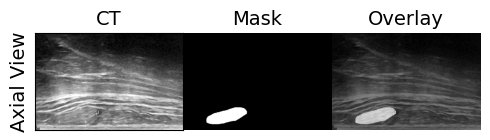

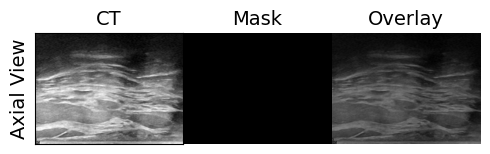

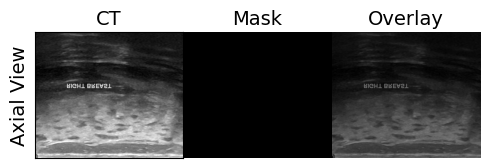

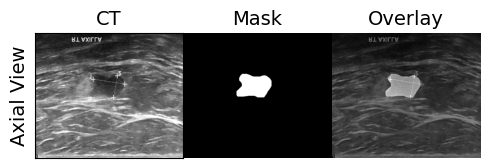

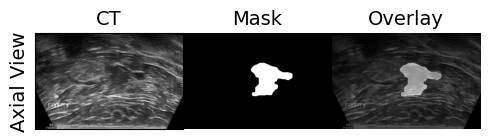

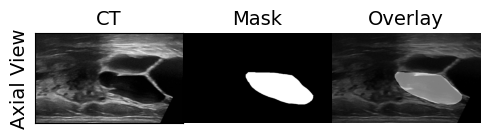

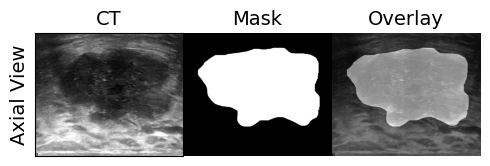

In [12]:
def plot_train_label(image_mask):
    image = cv2.imread(image_mask[0])
    mask = cv2.imread(image_mask[1])
    
    f, axarr = plt.subplots(1, 3, figsize=(5, 5))
    
    axarr[0].imshow(np.squeeze(image), cmap='gray')
    axarr[0].set_ylabel('Axial View', fontsize=14)
    axarr[0].set_xticks([])
    axarr[0].set_yticks([])
    axarr[0].set_title('CT', fontsize=14)

    axarr[1].imshow(np.squeeze(mask), cmap='jet')
    axarr[1].axis('off')
    axarr[1].set_title('Mask', fontsize=14)

    axarr[2].imshow(np.squeeze(image), cmap='gray', alpha=1)
    axarr[2].imshow(np.squeeze(mask), cmap='jet', alpha=0.5)
    axarr[2].axis('off')
    axarr[2].set_title('Overlay', fontsize=14)

    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

random.shuffle(series)
random_images = series[:7]
for image in random_images:
    plot_train_label(image)

# 🧬**UNet Model**

![UNET Architecture](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/u-net-architecture.png)

In [13]:
class ConvBlock(nn.Module):
    def __init__(self, input_channel, out_channel, dropout):
        super(ConvBlock, self).__init__()
        self.conv2d_1 = nn.Conv2d(input_channel, out_channel,
                                  kernel_size=3, padding=1)
        self.batchnorm_1 = nn.BatchNorm2d(out_channel)
        self.relu_1 = nn.ReLU()
        
        self.dropout = nn.Dropout(dropout)
        
        self.conv2d_2 = nn.Conv2d(out_channel, out_channel,
                                  kernel_size=3, padding=1)
        self.batchnorm_2 = nn.BatchNorm2d(out_channel)
        self.relu_2 = nn.ReLU()

    def forward(self, x):
        x = self.conv2d_1(x)
        x = self.batchnorm_1(x)
        x = self.relu_1(x)
        
        x = self.dropout(x)
        
        x = self.conv2d_2(x)
        x = self.batchnorm_2(x)
        x = self.relu_2(x)

        return x

class Encoder(nn.Module):
    def __init__(self, input_channel, out_channel, dropout):
        super(Encoder, self).__init__()
        self.conv2d_1 = ConvBlock(input_channel, out_channel, dropout)
        self.maxpool = nn.MaxPool2d((2,2))
        self.dropout = nn.Dropout(dropout)
        
    def forward(self, x):
        x = self.conv2d_1(x)
        p = self.maxpool(x)
        p = self.dropout(p)

        return x, p

class Decoder(nn.Module):
    def __init__(self, input_channel, output_channel, dropout):
        super(Decoder, self).__init__()
        self.conv_t = nn.ConvTranspose2d(input_channel, output_channel,
                                         stride=2, kernel_size=2)
        self.conv2d_1 = ConvBlock(output_channel*2, output_channel, dropout)
        self.dropout = nn.Dropout(dropout)
        
    def forward(self, x, skip):
        x = self.conv_t(x)
        x = torch.cat([x, skip], dim=1)
        x = self.dropout(x)
        x = self.conv2d_1(x)

        return x
class Unet(nn.Module):

    def __init__(self, input_channel=1):
        super().__init__()
        self.encoder_1 = Encoder(input_channel, 64, 0.07)
        self.encoder_2 = Encoder(64, 128, 0.08)
        self.encoder_3 = Encoder(128, 256, 0.09)
        self.encoder_4 = Encoder(256, 512, 0.1)

        self.conv_block = ConvBlock(512, 1024, 0.11)

        self.decoder_1 = Decoder(1024, 512, 0.1)
        self.decoder_2 = Decoder(512, 256, 0.09)
        self.decoder_3 = Decoder(256, 128, 0.08)
        self.decoder_4 = Decoder(128, 64, 0.07)

        self.cls = nn.Conv2d(64, 1, kernel_size=1, padding=0)
        self.relu = nn.Sigmoid() 

    def forward(self, x):

        """ ------ Encoder ------"""
        x1, p1 = self.encoder_1(x)
        x2, p2 = self.encoder_2(p1)
        x3, p3 = self.encoder_3(p2)
        x4, p4 = self.encoder_4(p3)

        """ ------ BottleNeck ------"""
        x5 = self.conv_block(p4)

        """ ------ Decoder ------"""
        x6 = self.decoder_1(x5, x4)
        x7 = self.decoder_2(x6, x3)
        x8 = self.decoder_3(x7, x2)
        x9 = self.decoder_4(x8, x1)
        
        """ ------ Final Layer ------"""
        x_final = self.cls(x9)
        x_final = self.relu(x_final)

        return x_final

## 🛠️ **Trainer Class for UNet**

In [17]:
class Trainer:
    def __init__(self, model, num_epochs, optimizer, criterion, device):
        self.num_epochs = num_epochs
        self.optimizer = optimizer
        self.criterion = criterion
        self.model = model
        self.device = device
        self.log_interval = 15

        # Lists to store training and validation metrics
        self.train_losses = []
        self.val_losses = []
        self.train_dices = []
        self.val_dices = []

        # Best model and its metrics
        self.best_model = None
        self.best_dice = 0.0
        self.best_epoch = 0

    def dice_coeff(self, predicted, target, smooth=1e-5):
        intersection = torch.sum(predicted * target)
        union = torch.sum(predicted) + torch.sum(target)
        dice = (2. * intersection + smooth) / (union + smooth)
        return dice

    def save_best_model(self, epoch, dice):
        if dice > self.best_dice:
            self.best_dice = dice
            self.best_epoch = epoch
            self.best_model = self.model.state_dict()

            filename = f'best_model_epoch{epoch}_dice{dice:.4f}.pth'
            torch.save(self.best_model, filename)

    def train(self, train_loader, val_loader):
        for epoch in range(self.num_epochs):
            train_loss = 0.0
            val_loss = 0.0
            train_dice = 0.0
            val_dice = 0.0

            # Training loop
            for i, (images, masks) in enumerate(train_loader):
                images, masks = images.to(self.device), masks.to(self.device)

                self.model.train()
                self.optimizer.zero_grad()

                outputs = self.model(images)
                loss = self.criterion(outputs, masks)
                dice = self.dice_coeff(outputs, masks)

                loss.backward()
                self.optimizer.step()

                train_loss += loss.item()
                train_dice += dice

                if (i + 1) % self.log_interval == 0:
                    print(f'Epoch [{epoch + 1}/{self.num_epochs}],
                    Step [{i + 1}/{len(train_loader)}],
                    Loss: {loss.item():.4f}, Dice Coef: {dice:.4f}')

            # Validation loop
            self.model.eval()
            with torch.no_grad():
                for images, masks in val_loader:
                    images, masks = images.to(self.device), masks.to(self.device)
                    outputs = self.model(images)
                    val_loss += self.criterion(outputs, masks).item()
                    val_dice += self.dice_coeff(outputs, masks)

            avg_train_loss = train_loss / len(train_loader)
            avg_val_loss = val_loss / len(val_loader)
            avg_train_dice = train_dice / len(train_loader)
            avg_val_dice = val_dice / len(val_loader)

            print(f'Epoch [{epoch + 1}/{self.num_epochs}],
            Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}')
            
            print(f'Epoch [{epoch + 1}/{self.num_epochs}], 
            Train Dice: {avg_train_dice:.4f}, Val Dice: {avg_val_dice:.4f}')

            # Save metrics
            self.train_losses.append(avg_train_loss)
            self.val_losses.append(avg_val_loss)
            self.train_dices.append(avg_train_dice)
            self.val_dices.append(avg_val_dice)
            
            if epoch + 1 == self.num_epochs:
                self.save_best_model(epoch + 1, avg_val_dice)
                
    def get_metrics(self):
        return {
            'train_losses': self.train_losses,
            'val_losses': self.val_losses,
            'train_dices': self.train_dices,
            'val_dices': self.val_dices,
            'best_model': self.best_model,
            'best_dice': self.best_dice,
            'best_epoch': self.best_epoch
        }

### ☠️ BCE Dice loss

In [18]:
def dice_coef_loss(inputs, target):
    smooth = 1e-6
    intersection = 2.0 * (target*inputs).sum() + smooth
    union = target.sum() + inputs.sum() + smooth
    return 1 - (intersection/union)

def bce_dice_loss(inputs, target):
    dice_score = dice_coef_loss(inputs, target)
    bce_loss = nn.BCELoss()
    bce_score = bce_loss(inputs, target)
    
    return bce_score + dice_score

## **📈 Train the UNet Model**

In [19]:
unet = Unet().to(device)

optimizer = optim.Adam(unet.parameters(), lr=LR_SEG, weight_decay=WEIGHT_DECAY)
trainer = Trainer(model=unet, num_epochs=NUM_EPOCH_SEG, optimizer=optimizer,
                  criterion=bce_dice_loss, device=device)
trainer.train(train_dataloader_seg, test_dataloader_seg)
metrics = trainer.get_metrics()

Epoch [1/40], Step [15/74], Loss: 1.3063, Dice Coef: 0.2168
Epoch [1/40], Step [30/74], Loss: 1.1569, Dice Coef: 0.2504
Epoch [1/40], Step [45/74], Loss: 1.2492, Dice Coef: 0.1576
Epoch [1/40], Step [60/74], Loss: 1.3399, Dice Coef: 0.0909
Epoch [1/40], Train Loss: 1.2523, Val Loss: 1.8149
Epoch [1/40], Train Dice: 0.2013, Val Dice: 0.2081
Epoch [2/40], Step [15/74], Loss: 1.1094, Dice Coef: 0.2549
Epoch [2/40], Step [30/74], Loss: 1.1171, Dice Coef: 0.2521
Epoch [2/40], Step [45/74], Loss: 1.0401, Dice Coef: 0.2638
Epoch [2/40], Step [60/74], Loss: 0.9229, Dice Coef: 0.3957
Epoch [2/40], Train Loss: 1.0659, Val Loss: 1.0101
Epoch [2/40], Train Dice: 0.2697, Val Dice: 0.2595
Epoch [3/40], Step [15/74], Loss: 1.1686, Dice Coef: 0.1632
Epoch [3/40], Step [30/74], Loss: 0.9399, Dice Coef: 0.3633
Epoch [3/40], Step [45/74], Loss: 0.9145, Dice Coef: 0.3886
Epoch [3/40], Step [60/74], Loss: 0.8834, Dice Coef: 0.4121
Epoch [3/40], Train Loss: 0.9615, Val Loss: 0.9794
Epoch [3/40], Train Dice:

## **🌃 Plot Loss, Dice, and Some Examples of the Model Output**

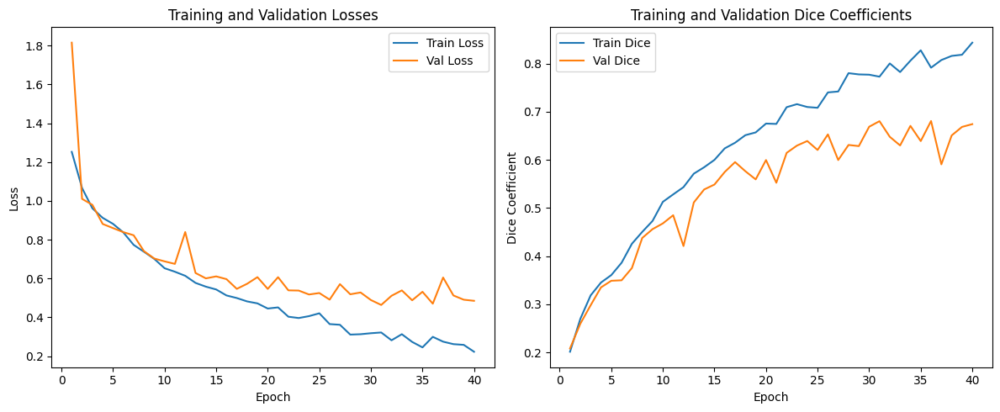

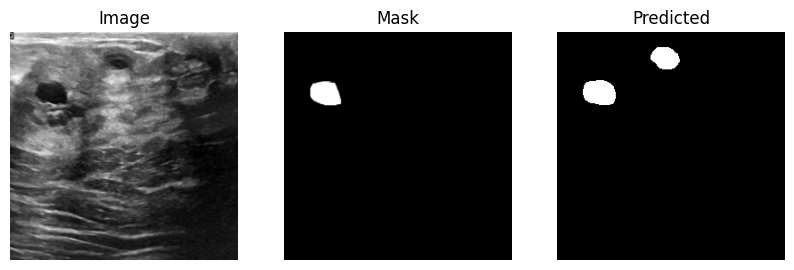

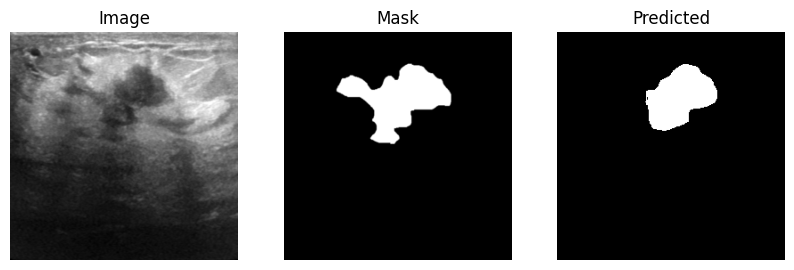

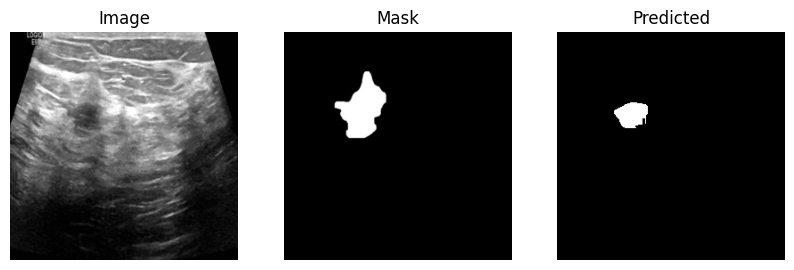

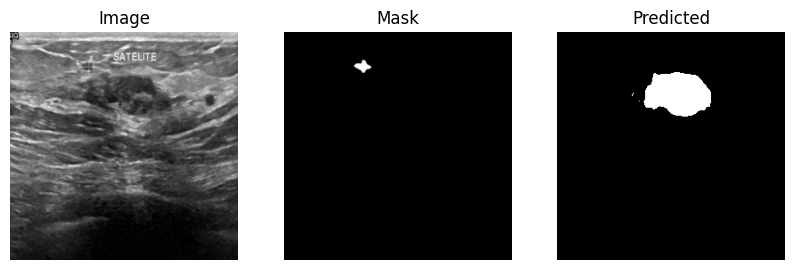

...

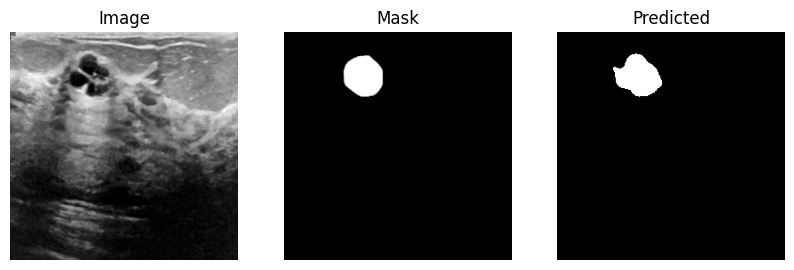

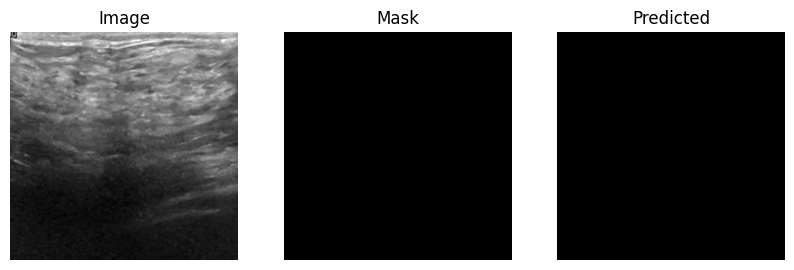

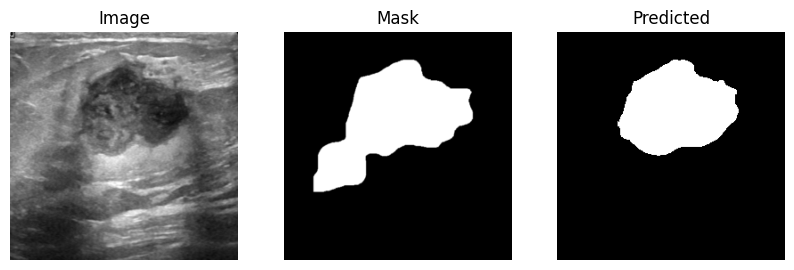

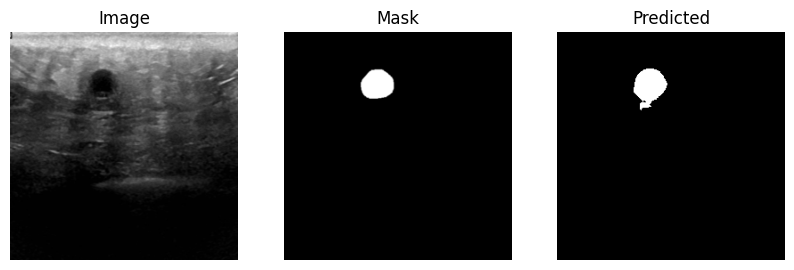

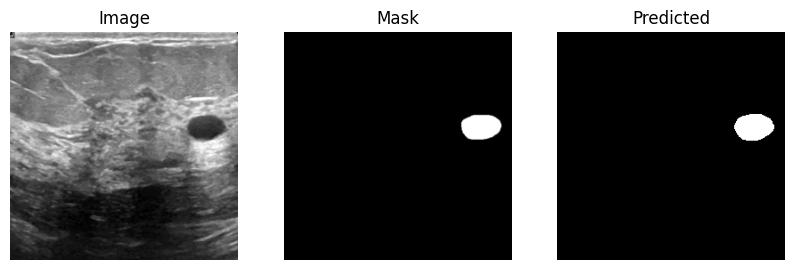

In [22]:
def to_numpy(tensor):
    # Move tensor to CPU and convert to NumPy array
    return tensor.cpu().detach().item()

def plot_metrics(metrics):
    num_epochs = len(metrics['train_losses'])
    epochs = np.arange(1, num_epochs + 1)

    # Convert tensors to NumPy arrays
    train_losses_np = metrics['train_losses']
    val_losses_np = metrics['val_losses']
    train_dices_np = [to_numpy(dice) for dice in metrics['train_dices']]
    val_dices_np = [to_numpy(dice) for dice in metrics['val_dices']]

    # Plot Losses
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses_np, label='Train Loss')
    plt.plot(epochs, val_losses_np, label='Val Loss')
    plt.title('Training and Validation Losses')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    # Plot Dice Coefficients
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_dices_np, label='Train Dice')
    plt.plot(epochs, val_dices_np, label='Val Dice')
    plt.title('Training and Validation Dice Coefficients')
    plt.xlabel('Epoch')
    plt.ylabel('Dice Coefficient')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_metrics(metrics)


def threshold_prediction(predicted, threshold=0.5):
    # Threshold predicted values
    predicted[predicted < threshold] = 0
    predicted[predicted >= threshold] = 1
    return predicted

def to_np(tensor):
    # Move tensor to CPU and convert to NumPy array
    return tensor.cpu().detach().numpy()

def plot_subplots(image, mask, predicted, threshold=0.5):
    # Convert tensors to NumPy arrays
    image_np, mask_np, predicted_np = map(to_np, (image, mask, predicted))

    # Threshold the predicted values
    predicted_np_thresholded = threshold_prediction(predicted_np, threshold)

    fig, axes = plt.subplots(1, 3, figsize=(10, 5))  # Adjust figsize as needed

    # Plot Image, Mask, Predicted, and Thresholded Predicted
    titles = ['Image', 'Mask', 'Predicted']
    for ax, data, title in zip(axes, [image_np, mask_np, predicted_np,
                                      predicted_np_thresholded], titles):
        ax.imshow(data.squeeze(), cmap='gray' if 'Mask' in title else 'gray')
        ax.set_title(title)
        ax.axis('off')

    plt.show()

random_numbers = [random.randint(0, 190) for _ in range(10)]
for i in random_numbers:
    image = test_dataset_seg[i][0]
    mask = test_dataset_seg[i][1]
    im = image.to(device)
    pred = unet(im.unsqueeze(0))
    pred = pred.squeeze()

    plot_subplots(im, mask, pred)

# **🌞 Transfer Learning and Fine-Tuning with VGG16, VGG19, and EfficientNet**

In [23]:
model_vgg16 = models.vgg16(pretrained=True)
model_vgg19 = models.vgg19(pretrained=True)
model_effnet = models.efficientnet_b7(pretrained=True)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:01<00:00, 326MB/s] 
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:01<00:00, 322MB/s] 
Downloading: "https://download.pytorch.org/models/efficientnet_b7_lukemelas-dcc49843.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b7_lukemelas-dcc49843.pth
100%|██████████| 255M/255M [00:02<00:00, 98.6MB/s] 


### VGG Network Architecture
![VGG](https://miro.medium.com/v2/resize:fit:720/format:webp/1*NNifzsJ7tD2kAfBXt3AzEg.png)

### EfficientNet Network Archtitecture
![](https://lh5.googleusercontent.com/1iAqzYErD-KDbcmvYHcJddwsDI0-LxBUjeatxH6Io0ckR7zcA5hVX0aaBqYw9b3a3TVOonYGiW_j6EeW3s8qCJHdudl8ayg8sol-9XCFW_U45W63l5vzK0DLiqg_ucfWG10YVzq5hwzDPds4CkNM7Og)

## 🛠️ **Trainer Class for Transfer Learning and Fine-Tuning**

In [24]:
class Trainer:
    def __init__(self, model, optimizer, criterion, device='cuda'):
        self.model = model.to(device)
        self.optimizer = optimizer
        self.criterion = criterion
        self.device = device
        self.metrics = {'train_loss': [], 'train_accuracy': [],
                        'val_loss': [], 'val_accuracy': []}

    def train_epoch(self, train_loader):
        self.model.train()
        total_loss = 0.0
        correct_predictions = 0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(self.device), labels.to(self.device)

            self.optimizer.zero_grad()

            outputs = self.model(inputs)
            loss = self.criterion(outputs, labels)
            loss.backward()
            self.optimizer.step()

            total_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            correct_predictions += (predicted == labels).sum().item()

        epoch_loss = total_loss / len(train_loader)
        epoch_accuracy = correct_predictions / len(train_loader.dataset)
        return epoch_loss, epoch_accuracy

    def evaluate(self, val_loader):
        self.model.eval()
        total_loss = 0.0
        correct_predictions = 0

        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(self.device), labels.to(self.device)

                outputs = self.model(inputs)
                loss = self.criterion(outputs, labels)

                total_loss += loss.item()
                _, predicted = torch.max(outputs, 1)
                correct_predictions += (predicted == labels).sum().item()

        epoch_loss = total_loss / len(val_loader)
        epoch_accuracy = correct_predictions / len(val_loader.dataset)
        return epoch_loss, epoch_accuracy

    def train(self, train_loader, val_loader, num_epochs=10):
        for epoch in range(num_epochs):
            train_loss, train_accuracy = self.train_epoch(train_loader)
            val_loss, val_accuracy = self.evaluate(val_loader)

            print(f'Epoch {epoch + 1}/{num_epochs} => '
                  f'Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f} | '
                  f'Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}')

            # Save metrics
            self.metrics['train_loss'].append(train_loss)
            self.metrics['train_accuracy'].append(train_accuracy)
            self.metrics['val_loss'].append(val_loss)
            self.metrics['val_accuracy'].append(val_accuracy)

    def get_metrics(self):
        return self.metrics

## **🚓 Transfer Learning**

In [25]:
vgg_classifier = nn.Sequential(
    nn.Flatten(),
    nn.Linear(25088, 4096),
    nn.ReLU(inplace=True),
    nn.Linear(4096, 4096),
    nn.ReLU(inplace=True),
    nn.Linear(4096, 1024),
    nn.ReLU(inplace=True),
    nn.Linear(1024, 3)
)

model_vgg16.classifier = vgg_classifier
model_vgg19.classifier = vgg_classifier

model_effnet.classifier = nn.Sequential(
        nn.Flatten(),
        nn.Linear(2560, 2024),
        nn.ReLU(inplace=True),
        nn.Linear(2024, 1024),
        nn.ReLU(inplace=True),
        nn.Linear(1024, 512),
        nn.ReLU(inplace=True),
        nn.Linear(512, 3)
    )

models_dict = {
    model_vgg16: 'VGG16',
    model_vgg19: 'VGG19',
    model_effnet: 'EfficientNet'
}

for model, name in models_dict.items():
    for param in model.parameters():
        if param.requires_grad:
            break
        else:
            for param in model.parameters():
                param.requires_grad = False
    
    model.to(device)
    print(f'The model {name} is ready!')
    print('-'*35)

The model VGG16 is ready!
-----------------------------------
The model VGG19 is ready!
-----------------------------------
The model EfficientNet is ready!
-----------------------------------


Training and Evaluating for VGG16!
-----------------------------------
Epoch 1/10 => Train Loss: 0.9239, Train Accuracy: 0.5187 | Val Loss: 1.0453, Val Accuracy: 0.6581
Epoch 2/10 => Train Loss: 0.7024, Train Accuracy: 0.7123 | Val Loss: 0.6601, Val Accuracy: 0.7290
Epoch 3/10 => Train Loss: 0.6613, Train Accuracy: 0.7566 | Val Loss: 0.7151, Val Accuracy: 0.6000
Epoch 4/10 => Train Loss: 0.4752, Train Accuracy: 0.8050 | Val Loss: 0.5779, Val Accuracy: 0.8065
Epoch 5/10 => Train Loss: 0.3410, Train Accuracy: 0.8866 | Val Loss: 0.5766, Val Accuracy: 0.7806
Epoch 6/10 => Train Loss: 0.2184, Train Accuracy: 0.9101 | Val Loss: 1.2034, Val Accuracy: 0.7677
Epoch 7/10 => Train Loss: 0.2102, Train Accuracy: 0.9447 | Val Loss: 0.9203, Val Accuracy: 0.7935
Epoch 8/10 => Train Loss: 0.1894, Train Accuracy: 0.9364 | Val Loss: 0.5254, Val Accuracy: 0.7677
Epoch 9/10 => Train Loss: 0.2305, Train Accuracy: 0.9115 | Val Loss: 0.5932, Val Accuracy: 0.7806
Epoch 10/10 => Train Loss: 0.1308, Train Accura

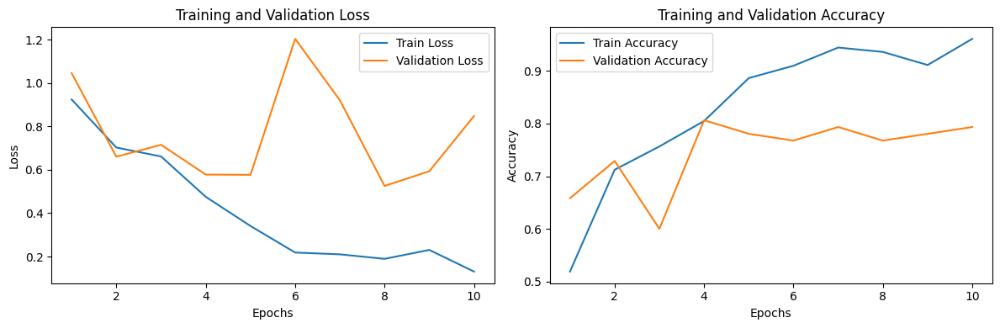

Training and Evaluating for VGG19!
-----------------------------------
Epoch 1/10 => Train Loss: 0.8784, Train Accuracy: 0.5726 | Val Loss: 0.7297, Val Accuracy: 0.6581
Epoch 2/10 => Train Loss: 0.7469, Train Accuracy: 0.6694 | Val Loss: 0.7652, Val Accuracy: 0.6323
Epoch 3/10 => Train Loss: 0.5499, Train Accuracy: 0.7663 | Val Loss: 0.6783, Val Accuracy: 0.7097
Epoch 4/10 => Train Loss: 0.3754, Train Accuracy: 0.8520 | Val Loss: 0.5472, Val Accuracy: 0.8129
Epoch 5/10 => Train Loss: 0.3242, Train Accuracy: 0.8949 | Val Loss: 0.5903, Val Accuracy: 0.7742
Epoch 6/10 => Train Loss: 0.3447, Train Accuracy: 0.8921 | Val Loss: 0.5292, Val Accuracy: 0.8129
Epoch 7/10 => Train Loss: 0.3597, Train Accuracy: 0.8741 | Val Loss: 0.8689, Val Accuracy: 0.5742
Epoch 8/10 => Train Loss: 0.3081, Train Accuracy: 0.9032 | Val Loss: 0.5384, Val Accuracy: 0.8323
Epoch 9/10 => Train Loss: 0.1125, Train Accuracy: 0.9654 | Val Loss: 0.6351, Val Accuracy: 0.8194
Epoch 10/10 => Train Loss: 0.1314, Train Accura

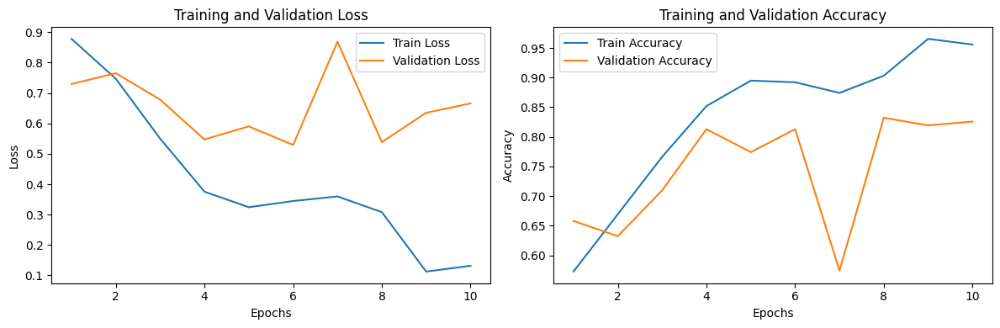

Training and Evaluating for EfficientNet!
-----------------------------------
Epoch 1/10 => Train Loss: 0.9418, Train Accuracy: 0.5795 | Val Loss: 0.8639, Val Accuracy: 0.5613
Epoch 2/10 => Train Loss: 0.5435, Train Accuracy: 0.7981 | Val Loss: 0.6370, Val Accuracy: 0.6903
Epoch 3/10 => Train Loss: 0.3469, Train Accuracy: 0.8714 | Val Loss: 0.6585, Val Accuracy: 0.7290
Epoch 4/10 => Train Loss: 0.2145, Train Accuracy: 0.9253 | Val Loss: 0.4889, Val Accuracy: 0.8323
Epoch 5/10 => Train Loss: 0.2339, Train Accuracy: 0.9115 | Val Loss: 0.4517, Val Accuracy: 0.8387
Epoch 6/10 => Train Loss: 0.2364, Train Accuracy: 0.9156 | Val Loss: 0.4766, Val Accuracy: 0.8000
Epoch 7/10 => Train Loss: 0.1264, Train Accuracy: 0.9557 | Val Loss: 0.6816, Val Accuracy: 0.7871
Epoch 8/10 => Train Loss: 0.2269, Train Accuracy: 0.9253 | Val Loss: 0.4580, Val Accuracy: 0.8323
Epoch 9/10 => Train Loss: 0.1621, Train Accuracy: 0.9433 | Val Loss: 0.5279, Val Accuracy: 0.8516
Epoch 10/10 => Train Loss: 0.1231, Train

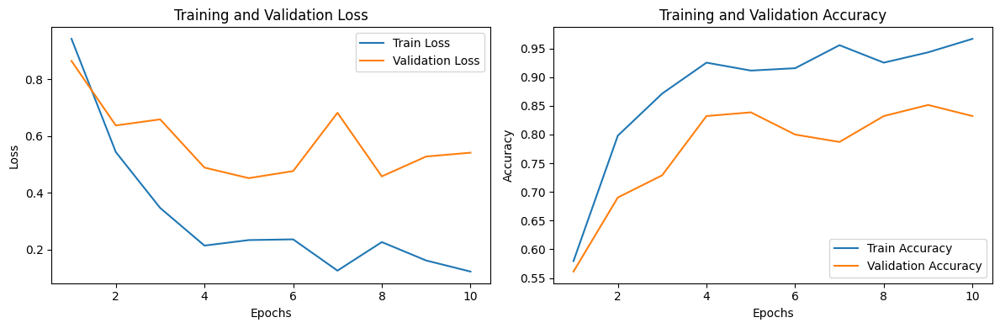

In [26]:
def plot_metrics(metrics):
    epochs = range(1, len(metrics['train_loss']) + 1)

    # Plot training and validation loss
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, metrics['train_loss'], label='Train Loss')
    plt.plot(epochs, metrics['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plot training and validation accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, metrics['train_accuracy'], label='Train Accuracy')
    plt.plot(epochs, metrics['val_accuracy'], label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()
    

for model, name in models_dict.items():
    print(f'Training and Evaluating for {name}!')
    print('-'*35)
    trainer = Trainer(model, optim.Adam(model.parameters(), lr=LR_SEG),
                      nn.CrossEntropyLoss())
    trainer.train(train_dataloader_cls, test_dataloader_cls, num_epochs=NUM_EPOCH_CLS)

    metrics = trainer.get_metrics()
    
    # Test on Validation Set
    correct_predictions = 0
    total_samples = 0
    with torch.no_grad():
        for inputs, labels in val_dataloader_cls:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            correct_predictions += (predicted == labels).sum().item()
            total_samples += labels.size(0)

    # Calculate accuracy
    accuracy = correct_predictions / total_samples
    print(f'Validation Accuracy: {accuracy * 100:.2f}%')
    
    plot_metrics(metrics)

## **✈️ Fine-Tuning**

In [27]:
print('Fine-tuning the last 20 layers for each model')
print('-'*35)
for model. name in models_dict.items(): 
    num_layers_to_unfreeze = 20 

    # Unfreeze the specified number of layers
    for param in list(model.features.children())[-num_layers_to_unfreeze:]:
        param.requires_grad = True
        
    model.to(device)
    print(f'The model {name} is ready!')
    print('-'*35)

Fine-tuning the last 20 layers for each model
-----------------------------------
The model EfficientNet is ready!
-----------------------------------
The model EfficientNet is ready!
-----------------------------------
The model EfficientNet is ready!
-----------------------------------


Training and Evaluating for VGG16!
-----------------------------------
Epoch 1/10 => Train Loss: 0.1304, Train Accuracy: 0.9654 | Val Loss: 1.1536, Val Accuracy: 0.8194
Epoch 2/10 => Train Loss: 0.0370, Train Accuracy: 0.9876 | Val Loss: 2.3293, Val Accuracy: 0.7806
Epoch 3/10 => Train Loss: 0.2465, Train Accuracy: 0.9364 | Val Loss: 1.1599, Val Accuracy: 0.7613
Epoch 4/10 => Train Loss: 0.1690, Train Accuracy: 0.9488 | Val Loss: 2.5738, Val Accuracy: 0.8258
Epoch 5/10 => Train Loss: 0.1652, Train Accuracy: 0.9544 | Val Loss: 0.6676, Val Accuracy: 0.7742
Epoch 6/10 => Train Loss: 0.0813, Train Accuracy: 0.9737 | Val Loss: 0.6976, Val Accuracy: 0.8000
Epoch 7/10 => Train Loss: 0.0167, Train Accuracy: 0.9889 | Val Loss: 0.9852, Val Accuracy: 0.8194
Epoch 8/10 => Train Loss: 0.1839, Train Accuracy: 0.9447 | Val Loss: 1.3538, Val Accuracy: 0.7484
Epoch 9/10 => Train Loss: 0.0864, Train Accuracy: 0.9668 | Val Loss: 0.8338, Val Accuracy: 0.7742
Epoch 10/10 => Train Loss: 0.3619, Train Accura

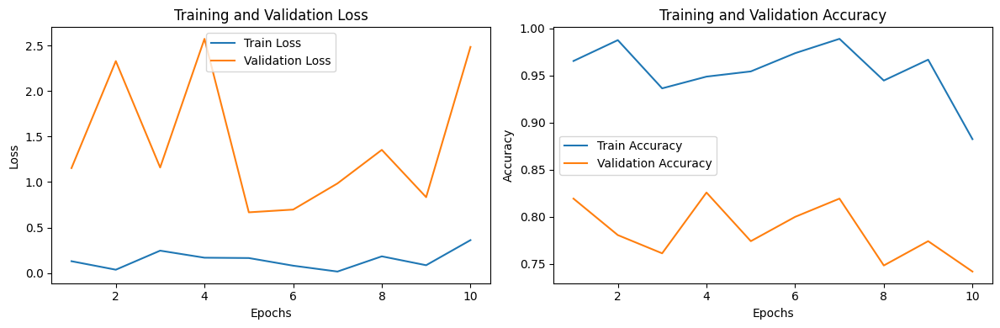

Training and Evaluating for VGG19!
-----------------------------------
Epoch 1/10 => Train Loss: 0.2131, Train Accuracy: 0.9571 | Val Loss: 0.7456, Val Accuracy: 0.8258
Epoch 2/10 => Train Loss: 0.2071, Train Accuracy: 0.9544 | Val Loss: 0.8589, Val Accuracy: 0.8323
Epoch 3/10 => Train Loss: 0.0648, Train Accuracy: 0.9834 | Val Loss: 1.1022, Val Accuracy: 0.8452
Epoch 4/10 => Train Loss: 0.3749, Train Accuracy: 0.8575 | Val Loss: 0.8482, Val Accuracy: 0.8387
Epoch 5/10 => Train Loss: 0.1201, Train Accuracy: 0.9488 | Val Loss: 0.7595, Val Accuracy: 0.8065
Epoch 6/10 => Train Loss: 0.1486, Train Accuracy: 0.9488 | Val Loss: 0.6616, Val Accuracy: 0.8452
Epoch 7/10 => Train Loss: 0.0265, Train Accuracy: 0.9889 | Val Loss: 1.3439, Val Accuracy: 0.8129
Epoch 8/10 => Train Loss: 0.0817, Train Accuracy: 0.9751 | Val Loss: 0.5514, Val Accuracy: 0.8387
Epoch 9/10 => Train Loss: 0.0948, Train Accuracy: 0.9737 | Val Loss: 0.7871, Val Accuracy: 0.8452
Epoch 10/10 => Train Loss: 0.0458, Train Accura

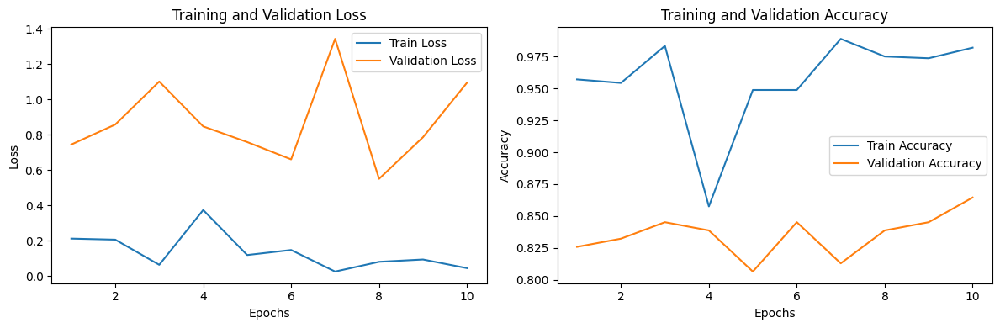

Training and Evaluating for EfficientNet!
-----------------------------------
Epoch 1/10 => Train Loss: 0.0964, Train Accuracy: 0.9613 | Val Loss: 0.6125, Val Accuracy: 0.8516
Epoch 2/10 => Train Loss: 0.1311, Train Accuracy: 0.9544 | Val Loss: 0.6930, Val Accuracy: 0.8065
Epoch 3/10 => Train Loss: 0.1297, Train Accuracy: 0.9613 | Val Loss: 0.4128, Val Accuracy: 0.8645
Epoch 4/10 => Train Loss: 0.1015, Train Accuracy: 0.9682 | Val Loss: 0.4782, Val Accuracy: 0.8323
Epoch 5/10 => Train Loss: 0.0705, Train Accuracy: 0.9710 | Val Loss: 0.5003, Val Accuracy: 0.8129
Epoch 6/10 => Train Loss: 0.0736, Train Accuracy: 0.9710 | Val Loss: 0.5280, Val Accuracy: 0.8581
Epoch 7/10 => Train Loss: 0.1442, Train Accuracy: 0.9557 | Val Loss: 0.4370, Val Accuracy: 0.8516
Epoch 8/10 => Train Loss: 0.0718, Train Accuracy: 0.9696 | Val Loss: 0.4340, Val Accuracy: 0.8774
Epoch 9/10 => Train Loss: 0.0962, Train Accuracy: 0.9737 | Val Loss: 0.4694, Val Accuracy: 0.8516
Epoch 10/10 => Train Loss: 0.0692, Train

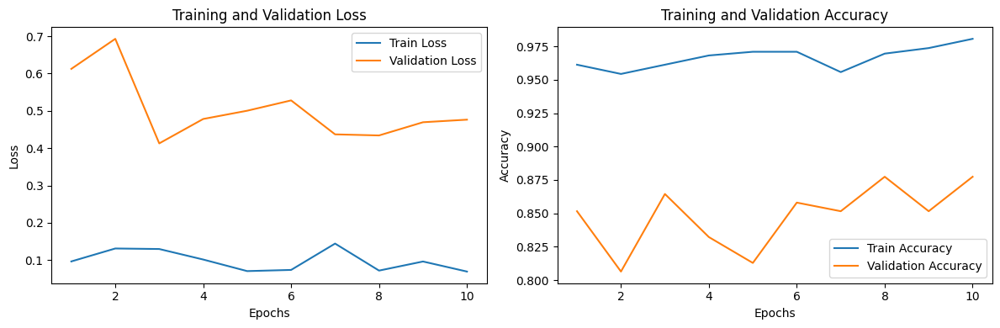

In [28]:
for model, name in models_dict.items():
    print(f'Training and Evaluating for {name}!')
    print('-'*35)
    
    trainer = Trainer(model, optim.Adam(model.parameters(), lr=LR_SEG),
                      nn.CrossEntropyLoss())
    trainer.train(train_dataloader_cls, test_dataloader_cls, num_epochs=NUM_EPOCH_CLS)

    metrics = trainer.get_metrics()
    
    # Test on Validation Set
    correct_predictions = 0
    total_samples = 0
    with torch.no_grad():
        for inputs, labels in val_dataloader_cls:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            correct_predictions += (predicted == labels).sum().item()
            total_samples += labels.size(0)

    # Calculate accuracy
    accuracy = correct_predictions / total_samples
    print(f'Val Accuracy: {accuracy * 100:.2f}%')

    plot_metrics(metrics)

# **👩‍⚕️ AutoEncoder (with Fully Connected Layers and CNN)**

![AutoEncoder](https://www.compthree.com/images/blog/ae/ae.png)

### 🗡️ With Fully Connected Layers

Epoch [1/100], Loss: 0.0363
Epoch [2/100], Loss: 0.0159
Epoch [3/100], Loss: 0.0141
Epoch [4/100], Loss: 0.0131
Epoch [5/100], Loss: 0.0140
Epoch [6/100], Loss: 0.0122
Epoch [7/100], Loss: 0.0182
Epoch [8/100], Loss: 0.0133
Epoch [9/100], Loss: 0.0103
Epoch [10/100], Loss: 0.0098
Epoch [11/100], Loss: 0.0105
Epoch [12/100], Loss: 0.0107
Epoch [13/100], Loss: 0.0084
Epoch [14/100], Loss: 0.0101
Epoch [15/100], Loss: 0.0133
Epoch [16/100], Loss: 0.0084
Epoch [17/100], Loss: 0.0099
Epoch [18/100], Loss: 0.0118
Epoch [19/100], Loss: 0.0109
Epoch [20/100], Loss: 0.0086
Epoch [21/100], Loss: 0.0095
Epoch [22/100], Loss: 0.0097
Epoch [23/100], Loss: 0.0111
Epoch [24/100], Loss: 0.0101
Epoch [25/100], Loss: 0.0095
Epoch [26/100], Loss: 0.0091
Epoch [27/100], Loss: 0.0116
Epoch [28/100], Loss: 0.0091
Epoch [29/100], Loss: 0.0092
Epoch [30/100], Loss: 0.0106
Epoch [31/100], Loss: 0.0117
Epoch [32/100], Loss: 0.0091
Epoch [33/100], Loss: 0.0087
Epoch [34/100], Loss: 0.0098
Epoch [35/100], Loss: 0

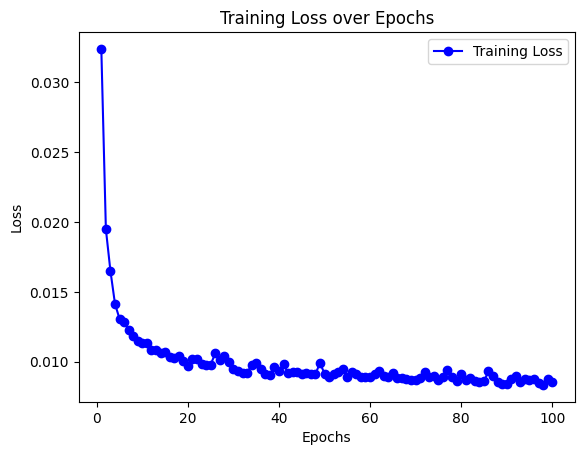

In [29]:
class LinearAutoencoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Linear(128*128, 64*64),
            nn.Tanh(),
            nn.Linear(64*64, 32*32),
            nn.Tanh(),
            nn.Linear(32*32, 16*16),
        )
        self.decoder = nn.Sequential(
            nn.Linear(16*16, 32*32),
            nn.Tanh(),
            nn.Linear(32*32, 64*64),
            nn.Tanh(),
            nn.Linear(64*64, 128*128),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x
    
    
lae = LinearAutoencoder().to(device)


criterion = nn.MSELoss()
optimizer = optim.Adam(lae.parameters(), lr=LR_SEG, weight_decay=WIGHT_DECAY_AE)
num_epochs = NUM_EPOCH_AE

losses = []
for epoch in range(1, num_epochs + 1):
    epoch_losses = []
    for image in dataloader_ae:
        image = image.view(-1, 128*128).to(device)
        outputs = lae(image)
        loss = criterion(outputs, image)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()    
        
        epoch_losses.append(loss.item())
        
    avg_epoch_loss = sum(epoch_losses) / len(epoch_losses)
    losses.append(avg_epoch_loss)
    print(f'Epoch [{epoch}/{num_epochs}], Loss: {loss.item():.4f}')
    
plt.plot(range(1, num_epochs + 1), losses, marker='o', linestyle='-',
         color='b', label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss over Epochs')
plt.legend()
plt.show()

## **🌅 Plot and Evaluate**

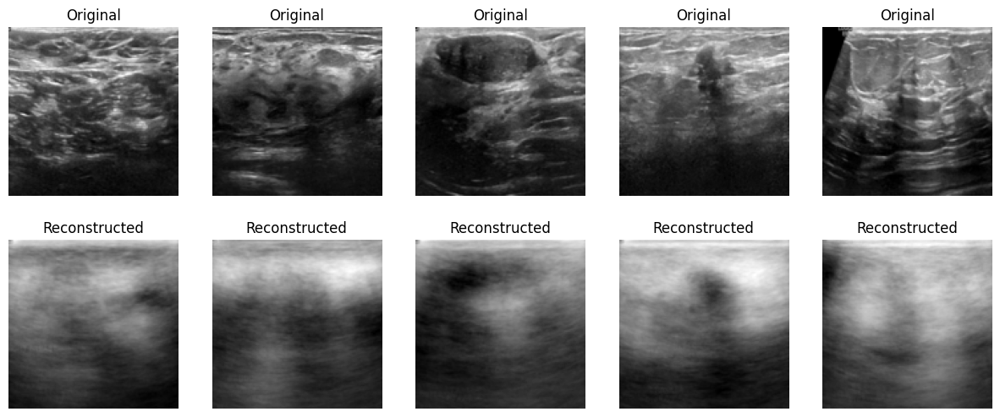

In [30]:
def plot_images(original_images, reconstructed_images, num_images=5, img_shape=(128, 128)):
    num_images = min(num_images, len(original_images))
    fig, axes = plt.subplots(2, num_images, figsize=(num_images * 3, 6))

    for i in range(num_images):
        axes[0, i].imshow(np.reshape(original_images[i], img_shape), cmap='gray')
        axes[0, i].axis('off')
        axes[0, i].set_title('Original')

        axes[1, i].imshow(np.reshape(reconstructed_images[i], img_shape), cmap='gray')
        axes[1, i].axis('off')
        axes[1, i].set_title('Reconstructed')

    plt.show()
    
lae.eval()

for images in dataloader_ae:
    images = images.to(device)
    images = images.view(images.size(0), -1)
    reconstructed_images = lae(images)
    images_np = images.cpu().numpy()
    reconstructed_np = reconstructed_images.cpu().detach().numpy()
    
    plot_images(images_np, reconstructed_np)
    break

### ⚔️ With CNN

Epoch [1/100], Loss: 0.0339
Epoch [2/100], Loss: 0.0419
Epoch [3/100], Loss: 0.0123
Epoch [4/100], Loss: 0.0109
Epoch [5/100], Loss: 0.0102
Epoch [6/100], Loss: 0.0265
Epoch [7/100], Loss: 0.0304
Epoch [8/100], Loss: 0.0135
Epoch [9/100], Loss: 0.0110
Epoch [10/100], Loss: 0.0100
Epoch [11/100], Loss: 0.0078
Epoch [12/100], Loss: 0.0093
Epoch [13/100], Loss: 0.0066
Epoch [14/100], Loss: 0.0056
Epoch [15/100], Loss: 0.0129
Epoch [16/100], Loss: 0.0044
Epoch [17/100], Loss: 0.0075
Epoch [18/100], Loss: 0.0052
Epoch [19/100], Loss: 0.0030
Epoch [20/100], Loss: 0.0041
Epoch [21/100], Loss: 0.0031
Epoch [22/100], Loss: 0.0035
Epoch [23/100], Loss: 0.0025
Epoch [24/100], Loss: 0.0098
Epoch [25/100], Loss: 0.0047
Epoch [26/100], Loss: 0.0076
Epoch [27/100], Loss: 0.0037
Epoch [28/100], Loss: 0.0041
Epoch [29/100], Loss: 0.0028
Epoch [30/100], Loss: 0.0024
Epoch [31/100], Loss: 0.0022
Epoch [32/100], Loss: 0.0051
Epoch [33/100], Loss: 0.0033
Epoch [34/100], Loss: 0.0219
Epoch [35/100], Loss: 0

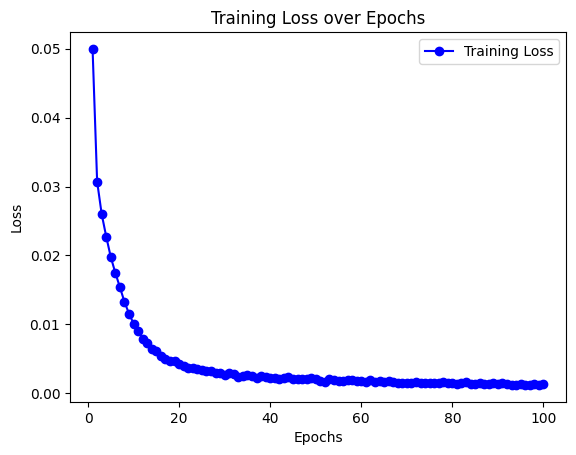

In [31]:
class CNNAutoEncoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 16, 3, stride=2, padding=1),
            nn.Tanh(),
            nn.BatchNorm2d(16),
            nn.Conv2d(16, 32, 3, stride=2, padding=1),
            nn.Tanh(),
            nn.BatchNorm2d(32),
            nn.Conv2d(32, 64, 3, stride=2, padding=1),
            nn.Tanh(),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 128, 3, stride=2, padding=1),
        )
        
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1),
            nn.Tanh(),
            nn.BatchNorm2d(64),
            nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1, output_padding=1),
            nn.Tanh(),
            nn.BatchNorm2d(32),
            nn.ConvTranspose2d(32, 16, 3, stride=2, padding=1, output_padding=1),
            nn.Tanh(),
            nn.BatchNorm2d(16),
            nn.ConvTranspose2d(16, 1, 3, stride=2, padding=1, output_padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        encoder = self.encoder(x)
        decoder = self.decoder(encoder)
        
        return decoder
    
    
cae = CNNAutoEncoder().to(device)


criterion = nn.MSELoss()
optimizer = optim.Adam(cae.parameters(), lr=LR_SEG, weight_decay=WIGHT_DECAY_AE)
num_epochs = NUM_EPOCH_AE

losses = []
for epoch in range(1, num_epochs + 1):
    epoch_losses = []
    for image in dataloader_ae:
        image = image.to(device)
        outputs = cae(image)
        loss = criterion(outputs, image)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        epoch_losses.append(loss.item())
    
    avg_epoch_loss = sum(epoch_losses) / len(epoch_losses)
    losses.append(avg_epoch_loss)
    print(f'Epoch [{epoch}/{num_epochs}], Loss: {loss.item():.4f}')
    
    
plt.plot(range(1, num_epochs + 1), losses, marker='o', linestyle='-', color='b',
         label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss over Epochs')
plt.legend()
plt.show()

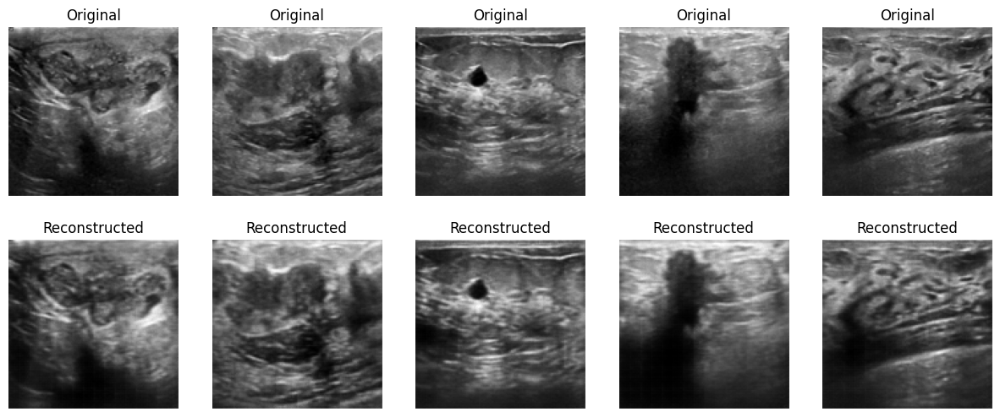

In [32]:
cae.eval()

for images in dataloader_ae:
    images = images.to(device)
    reconstructed_images = cae(images)
    images_np = images.cpu().numpy()
    reconstructed_np = reconstructed_images.cpu().detach().numpy()
    
    plot_images(images_np, reconstructed_np)
    break

# **🧙‍♂️Deep Convolutional Generative Adversarial Networks (DCGAN)**

## 🌃 Plot a batch

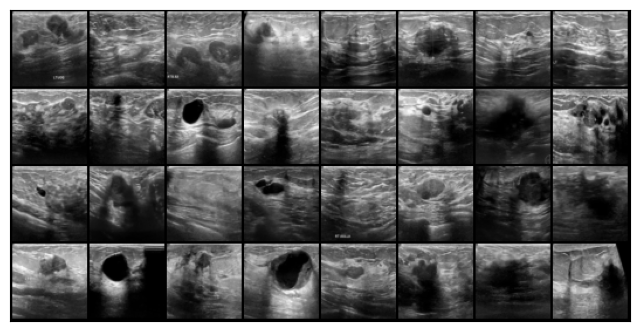

In [33]:
def denorm(img_tensors):
    return img_tensors * normal[1][0] + normal[0][0]

def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images in dl:
        show_images(images, nmax)
        break
        
show_batch(dataloader_gan)

![DCGAN](https://miro.medium.com/v2/resize:fit:1200/1*_9hPec99hHANT07Hmt7AUA.png)

In [34]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            # in: 3 x 64 x 64
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),
            # out: 64 x 32 x 32

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            # out: 128 x 16 x 16

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            # out: 256 x 8 x 8

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            # out: 512 x 4 x 4

            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
            # out: 1 x 1 x 1

            nn.Flatten(),
            nn.Sigmoid())

    def forward(self, x):
        return self.model(x)


class Generator(nn.Module):
    def __init__(self, latent_size):
        super(Generator, self).__init__()
        ls = latent_size
        self.model =  nn.Sequential(
            # in: latent_size x 1 x 1

            nn.ConvTranspose2d(ls, 512, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            # out: 512 x 4 x 4

            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            # out: 256 x 8 x 8

            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            # out: 128 x 16 x 16

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            # out: 64 x 32 x 32

            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
            # out: 3 x 64 x 64
        )

    def forward(self, x):
        return self.model(x)

In [35]:
latent_size = LATENT_SIZE  
generator = Generator(latent_size)
discriminator = Discriminator()

## 🎨 Plot a Random Noise generated by the generator

torch.Size([32, 3, 64, 64])


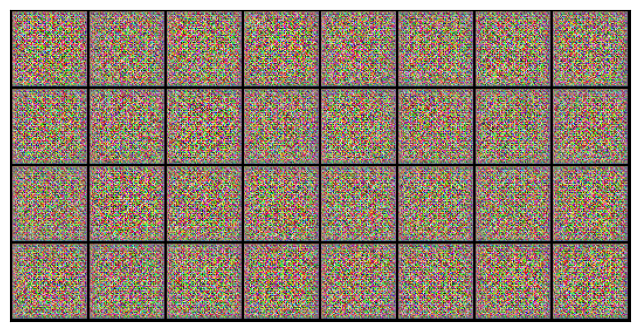

In [36]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [1/150], loss_g: 7.9834, loss_d: 0.0375, real_score: 0.9722, fake_score: 0.0077
Saving generated-images-0001.png


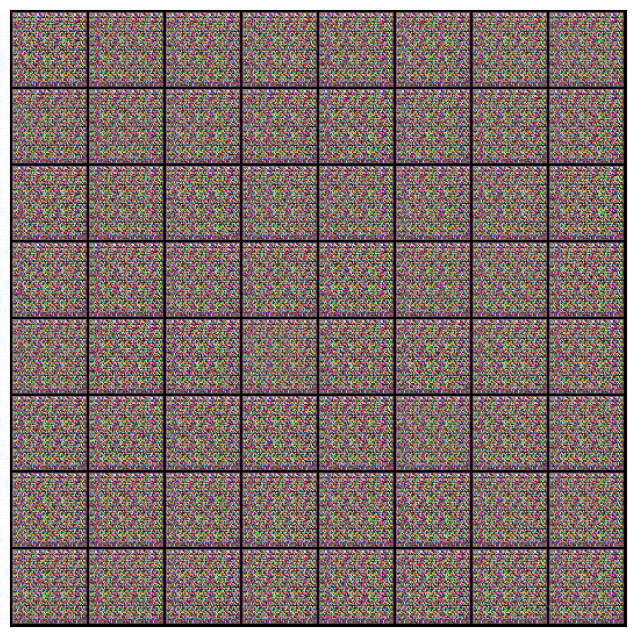

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [2/150], loss_g: 5.7751, loss_d: 0.0143, real_score: 0.9932, fake_score: 0.0073


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [3/150], loss_g: 12.7337, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [4/150], loss_g: 12.0664, loss_d: 0.0271, real_score: 0.9757, fake_score: 0.0002


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [5/150], loss_g: 4.8998, loss_d: 0.0699, real_score: 0.9489, fake_score: 0.0116


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [6/150], loss_g: 4.8530, loss_d: 0.0159, real_score: 0.9873, fake_score: 0.0028


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [7/150], loss_g: 9.2808, loss_d: 0.0407, real_score: 0.9982, fake_score: 0.0380


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [8/150], loss_g: 6.9341, loss_d: 0.0268, real_score: 0.9978, fake_score: 0.0242


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [9/150], loss_g: 6.1547, loss_d: 0.0061, real_score: 0.9974, fake_score: 0.0034


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [10/150], loss_g: 2.0458, loss_d: 0.0968, real_score: 0.9150, fake_score: 0.0037


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [11/150], loss_g: 5.1327, loss_d: 0.0802, real_score: 0.9661, fake_score: 0.0442
Saving generated-images-0011.png


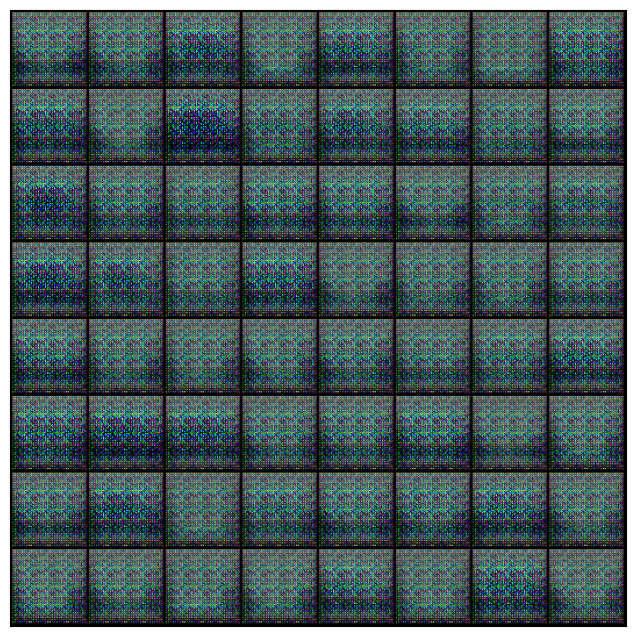

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [12/150], loss_g: 5.0359, loss_d: 0.0951, real_score: 0.9432, fake_score: 0.0320


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [13/150], loss_g: 5.8426, loss_d: 0.0413, real_score: 0.9858, fake_score: 0.0258


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [14/150], loss_g: 5.6322, loss_d: 0.0169, real_score: 0.9976, fake_score: 0.0143


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [15/150], loss_g: 5.9882, loss_d: 0.0308, real_score: 0.9796, fake_score: 0.0087


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [16/150], loss_g: 6.2681, loss_d: 0.0121, real_score: 0.9947, fake_score: 0.0067


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [17/150], loss_g: 6.0568, loss_d: 0.0103, real_score: 0.9960, fake_score: 0.0063


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [18/150], loss_g: 6.4403, loss_d: 0.0108, real_score: 0.9955, fake_score: 0.0062


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [19/150], loss_g: 6.2570, loss_d: 0.0039, real_score: 0.9994, fake_score: 0.0034


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [20/150], loss_g: 6.7371, loss_d: 0.0024, real_score: 0.9998, fake_score: 0.0022


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [21/150], loss_g: 6.5965, loss_d: 0.0039, real_score: 0.9991, fake_score: 0.0029
Saving generated-images-0021.png


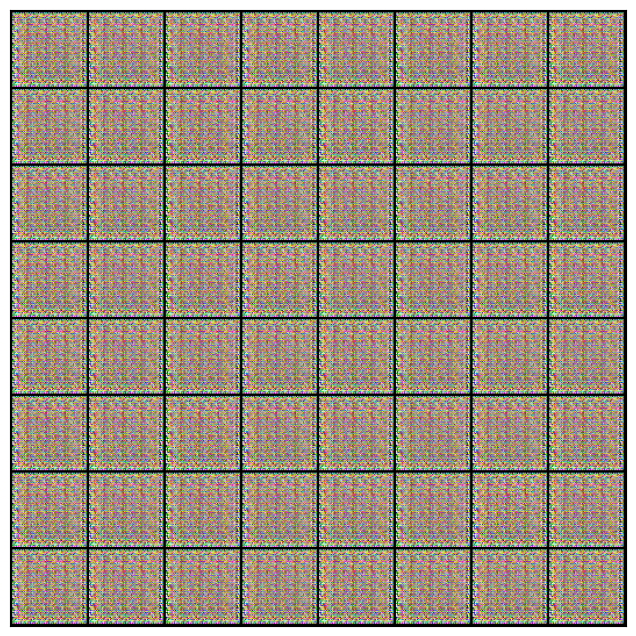

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [22/150], loss_g: 6.9624, loss_d: 0.0020, real_score: 0.9994, fake_score: 0.0014


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [23/150], loss_g: 7.9170, loss_d: 0.0053, real_score: 0.9953, fake_score: 0.0004


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [24/150], loss_g: 7.1223, loss_d: 0.0042, real_score: 0.9977, fake_score: 0.0018


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [25/150], loss_g: 25.4156, loss_d: 2.7711, real_score: 0.9980, fake_score: 0.9365


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [26/150], loss_g: 4.8107, loss_d: 0.0964, real_score: 0.9867, fake_score: 0.0790


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [27/150], loss_g: 4.8935, loss_d: 0.1095, real_score: 0.9346, fake_score: 0.0378


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [28/150], loss_g: 3.8245, loss_d: 0.3428, real_score: 0.8810, fake_score: 0.1831


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [29/150], loss_g: 2.0231, loss_d: 0.8203, real_score: 0.5501, fake_score: 0.1416


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [30/150], loss_g: 2.6510, loss_d: 0.6655, real_score: 0.9430, fake_score: 0.4343


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [31/150], loss_g: 4.4097, loss_d: 0.5913, real_score: 0.9536, fake_score: 0.4065
Saving generated-images-0031.png


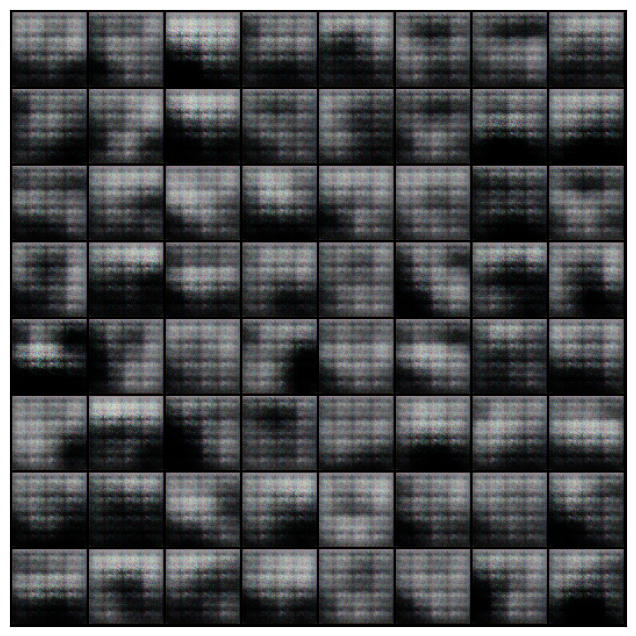

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [32/150], loss_g: 3.7165, loss_d: 0.6298, real_score: 0.8023, fake_score: 0.2932


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [33/150], loss_g: 1.6937, loss_d: 0.8353, real_score: 0.8729, fake_score: 0.4822


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [34/150], loss_g: 3.0144, loss_d: 0.4957, real_score: 0.6739, fake_score: 0.0123


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [35/150], loss_g: 6.4083, loss_d: 0.3837, real_score: 0.9804, fake_score: 0.2965


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [36/150], loss_g: 2.8058, loss_d: 0.2287, real_score: 0.8527, fake_score: 0.0511


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [37/150], loss_g: 4.7279, loss_d: 0.4964, real_score: 0.9321, fake_score: 0.3125


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [38/150], loss_g: 4.0997, loss_d: 0.4517, real_score: 0.7393, fake_score: 0.0683


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [39/150], loss_g: 2.2760, loss_d: 0.4714, real_score: 0.6779, fake_score: 0.0488


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [40/150], loss_g: 6.2246, loss_d: 0.6348, real_score: 0.9728, fake_score: 0.4163


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [41/150], loss_g: 3.7756, loss_d: 0.1265, real_score: 0.9181, fake_score: 0.0351
Saving generated-images-0041.png


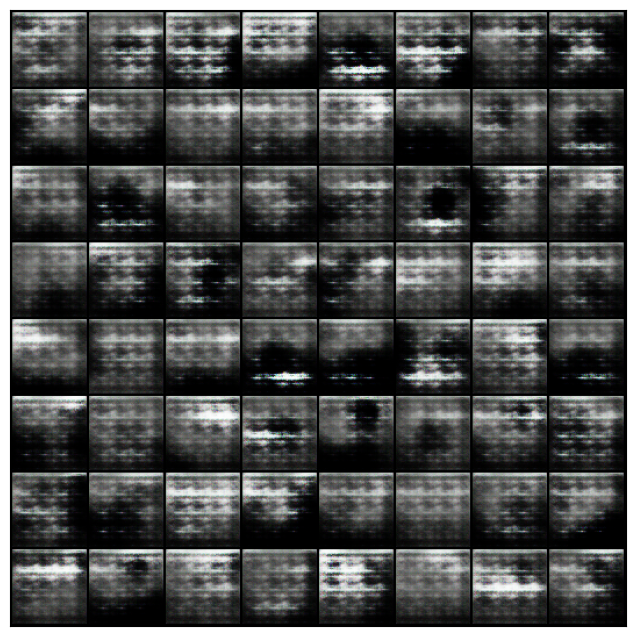

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [42/150], loss_g: 4.0018, loss_d: 0.1266, real_score: 0.9626, fake_score: 0.0801


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [43/150], loss_g: 2.4857, loss_d: 1.2052, real_score: 0.4826, fake_score: 0.1352


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [44/150], loss_g: 2.2151, loss_d: 0.2748, real_score: 0.8069, fake_score: 0.0144


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [45/150], loss_g: 4.0050, loss_d: 0.3165, real_score: 0.9489, fake_score: 0.1913


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [46/150], loss_g: 4.3702, loss_d: 0.1137, real_score: 0.9638, fake_score: 0.0709


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [47/150], loss_g: 4.5922, loss_d: 0.2169, real_score: 0.9747, fake_score: 0.1567


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [48/150], loss_g: 5.5003, loss_d: 0.4950, real_score: 0.8990, fake_score: 0.2803


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [49/150], loss_g: 5.0264, loss_d: 0.3459, real_score: 0.9804, fake_score: 0.2595


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [50/150], loss_g: 3.5250, loss_d: 0.6099, real_score: 0.8228, fake_score: 0.2877


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [51/150], loss_g: 4.8168, loss_d: 0.1400, real_score: 0.9160, fake_score: 0.0475
Saving generated-images-0051.png


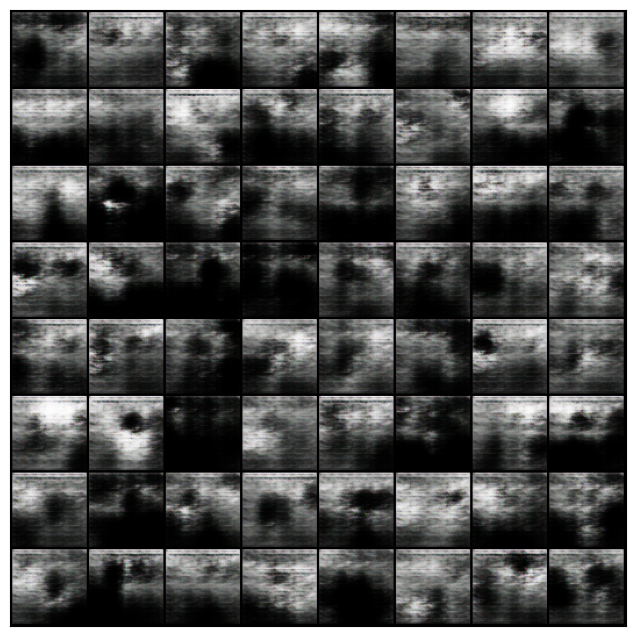

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [52/150], loss_g: 3.1079, loss_d: 0.3692, real_score: 0.9626, fake_score: 0.2487


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [53/150], loss_g: 4.4385, loss_d: 0.3793, real_score: 0.8373, fake_score: 0.1570


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [54/150], loss_g: 6.4281, loss_d: 0.1735, real_score: 0.9215, fake_score: 0.0791


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [55/150], loss_g: 9.6223, loss_d: 1.1437, real_score: 0.9514, fake_score: 0.5910


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [56/150], loss_g: 8.4408, loss_d: 1.2599, real_score: 0.9780, fake_score: 0.6505


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [57/150], loss_g: 4.4834, loss_d: 0.3289, real_score: 0.7843, fake_score: 0.0559


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [58/150], loss_g: 2.9416, loss_d: 0.1222, real_score: 0.9185, fake_score: 0.0229


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [59/150], loss_g: 5.0720, loss_d: 0.1311, real_score: 0.9089, fake_score: 0.0291


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [60/150], loss_g: 4.3931, loss_d: 0.2543, real_score: 0.8230, fake_score: 0.0306


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [61/150], loss_g: 4.9813, loss_d: 0.1745, real_score: 0.9085, fake_score: 0.0609
Saving generated-images-0061.png


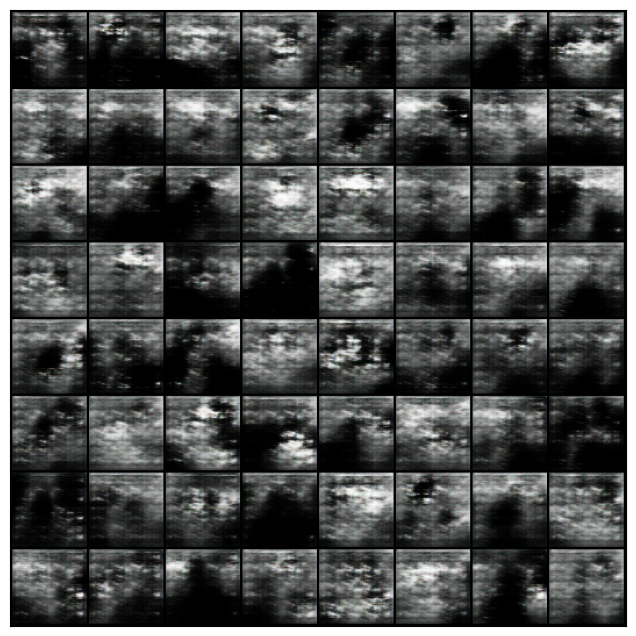

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [62/150], loss_g: 5.5999, loss_d: 0.2155, real_score: 0.8920, fake_score: 0.0897


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [63/150], loss_g: 8.8343, loss_d: 1.4938, real_score: 0.9802, fake_score: 0.6655


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [64/150], loss_g: 4.5375, loss_d: 0.4118, real_score: 0.9485, fake_score: 0.2709


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [65/150], loss_g: 6.0707, loss_d: 0.5344, real_score: 0.9721, fake_score: 0.3643


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [66/150], loss_g: 8.1277, loss_d: 0.5010, real_score: 0.9452, fake_score: 0.3318


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [67/150], loss_g: 4.7760, loss_d: 0.4591, real_score: 0.9194, fake_score: 0.2922


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [68/150], loss_g: 3.6655, loss_d: 0.3914, real_score: 0.8067, fake_score: 0.1492


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [69/150], loss_g: 1.2143, loss_d: 0.6436, real_score: 0.6832, fake_score: 0.0916


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [70/150], loss_g: 4.7157, loss_d: 0.2301, real_score: 0.9025, fake_score: 0.1087


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [71/150], loss_g: 9.5099, loss_d: 0.6088, real_score: 0.9455, fake_score: 0.3411
Saving generated-images-0071.png


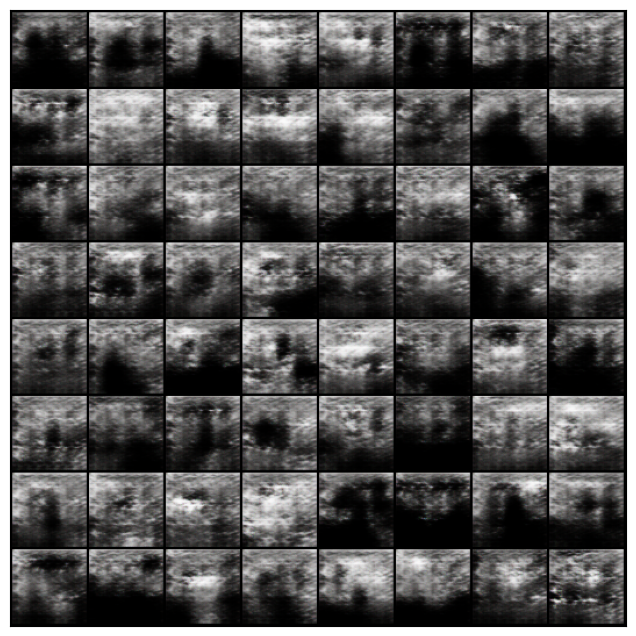

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [72/150], loss_g: 1.6256, loss_d: 0.5034, real_score: 0.6635, fake_score: 0.0401


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [73/150], loss_g: 4.6266, loss_d: 0.4580, real_score: 0.7610, fake_score: 0.1485


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [74/150], loss_g: 5.0261, loss_d: 0.3848, real_score: 0.7620, fake_score: 0.0659


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [75/150], loss_g: 3.3392, loss_d: 0.1560, real_score: 0.8975, fake_score: 0.0382


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [76/150], loss_g: 5.5695, loss_d: 0.3207, real_score: 0.8684, fake_score: 0.1476


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [77/150], loss_g: 4.7881, loss_d: 0.1819, real_score: 0.9219, fake_score: 0.0863


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [78/150], loss_g: 4.5530, loss_d: 0.5731, real_score: 0.9323, fake_score: 0.3103


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [79/150], loss_g: 7.5657, loss_d: 0.7584, real_score: 0.9588, fake_score: 0.4460


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [80/150], loss_g: 4.3081, loss_d: 0.5557, real_score: 0.6168, fake_score: 0.0024


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [81/150], loss_g: 4.6928, loss_d: 1.2948, real_score: 0.6560, fake_score: 0.4712
Saving generated-images-0081.png


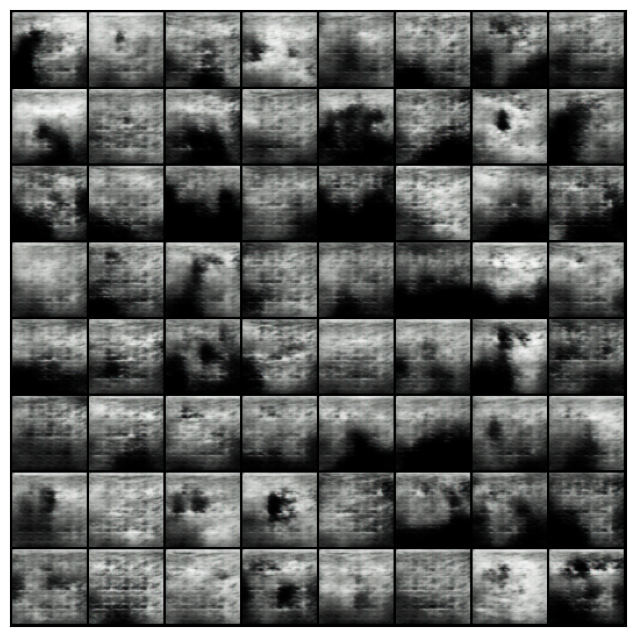

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [82/150], loss_g: 3.1980, loss_d: 0.3010, real_score: 0.8137, fake_score: 0.0611


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [83/150], loss_g: 3.4753, loss_d: 0.2480, real_score: 0.8220, fake_score: 0.0233


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [84/150], loss_g: 6.6406, loss_d: 0.3247, real_score: 0.9683, fake_score: 0.2123


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [85/150], loss_g: 3.9564, loss_d: 0.2349, real_score: 0.9009, fake_score: 0.0935


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [86/150], loss_g: 5.1028, loss_d: 0.2316, real_score: 0.9306, fake_score: 0.1406


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [87/150], loss_g: 3.1773, loss_d: 0.4895, real_score: 0.6872, fake_score: 0.0325


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [88/150], loss_g: 8.3705, loss_d: 0.5848, real_score: 0.9779, fake_score: 0.3743


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [89/150], loss_g: 8.1532, loss_d: 0.4867, real_score: 0.6848, fake_score: 0.0010


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [90/150], loss_g: 5.3663, loss_d: 0.2861, real_score: 0.7856, fake_score: 0.0217


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [91/150], loss_g: 5.8500, loss_d: 0.2226, real_score: 0.9611, fake_score: 0.1501
Saving generated-images-0091.png


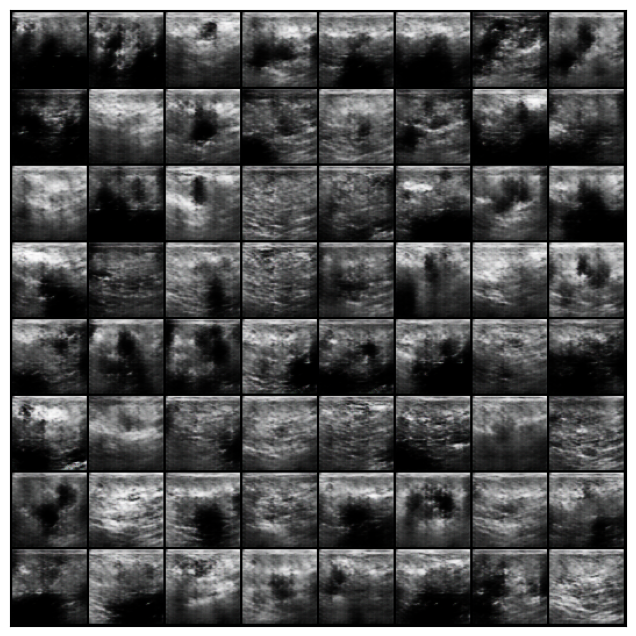

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [92/150], loss_g: 4.5442, loss_d: 0.7343, real_score: 0.5366, fake_score: 0.0036


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [93/150], loss_g: 4.7344, loss_d: 0.2104, real_score: 0.9471, fake_score: 0.1261


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [94/150], loss_g: 3.5850, loss_d: 0.2921, real_score: 0.9155, fake_score: 0.1717


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [95/150], loss_g: 6.5706, loss_d: 0.5522, real_score: 0.9105, fake_score: 0.2692


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [96/150], loss_g: 2.9703, loss_d: 0.4396, real_score: 0.7632, fake_score: 0.1237


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [97/150], loss_g: 2.3482, loss_d: 0.6218, real_score: 0.6166, fake_score: 0.0784


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [98/150], loss_g: 4.5327, loss_d: 0.5669, real_score: 0.7935, fake_score: 0.2291


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [99/150], loss_g: 7.3745, loss_d: 0.3961, real_score: 0.9712, fake_score: 0.2793


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [100/150], loss_g: 5.5947, loss_d: 0.1676, real_score: 0.8861, fake_score: 0.0313


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [101/150], loss_g: 3.9142, loss_d: 0.3110, real_score: 0.8053, fake_score: 0.0538
Saving generated-images-0101.png


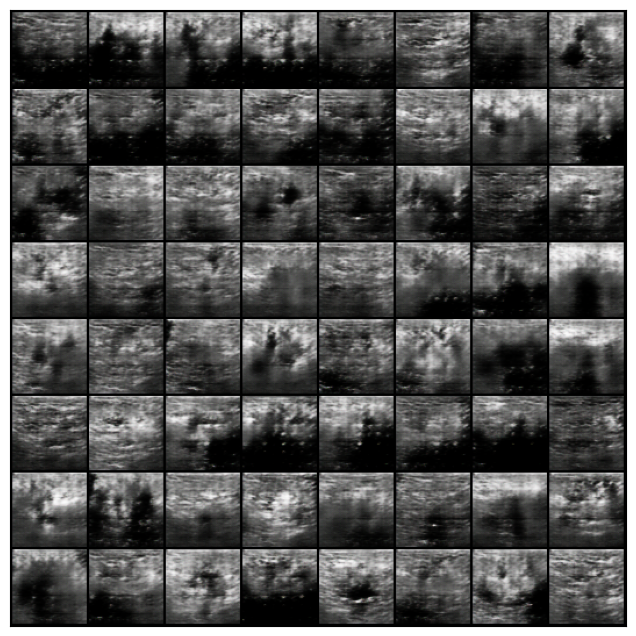

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [102/150], loss_g: 3.8447, loss_d: 0.9012, real_score: 0.4909, fake_score: 0.0049


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [103/150], loss_g: 3.7281, loss_d: 0.0834, real_score: 0.9903, fake_score: 0.0692


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [104/150], loss_g: 2.6255, loss_d: 0.7161, real_score: 0.5377, fake_score: 0.0211


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [105/150], loss_g: 2.9948, loss_d: 0.3553, real_score: 0.7340, fake_score: 0.0175


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [106/150], loss_g: 3.9260, loss_d: 0.3605, real_score: 0.7363, fake_score: 0.0259


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [107/150], loss_g: 3.7090, loss_d: 0.4386, real_score: 0.7439, fake_score: 0.0889


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [108/150], loss_g: 1.9560, loss_d: 0.3275, real_score: 0.8307, fake_score: 0.1015


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [109/150], loss_g: 4.9189, loss_d: 0.1988, real_score: 0.9088, fake_score: 0.0754


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [110/150], loss_g: 3.9461, loss_d: 0.0986, real_score: 0.9309, fake_score: 0.0247


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [111/150], loss_g: 4.2188, loss_d: 0.3602, real_score: 0.7618, fake_score: 0.0233
Saving generated-images-0111.png


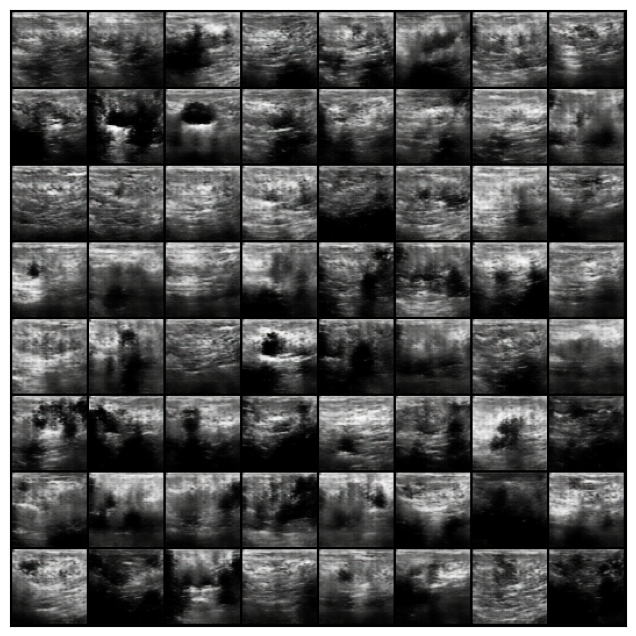

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [112/150], loss_g: 7.7849, loss_d: 0.2241, real_score: 0.8192, fake_score: 0.0032


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [113/150], loss_g: 2.2375, loss_d: 0.4758, real_score: 0.6908, fake_score: 0.0265


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [114/150], loss_g: 5.2252, loss_d: 0.2201, real_score: 0.9391, fake_score: 0.1358


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [115/150], loss_g: 7.6156, loss_d: 0.3990, real_score: 0.9828, fake_score: 0.2669


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [116/150], loss_g: 6.9793, loss_d: 0.0649, real_score: 0.9452, fake_score: 0.0071


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [117/150], loss_g: 4.5858, loss_d: 0.3624, real_score: 0.8801, fake_score: 0.1724


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [118/150], loss_g: 4.4179, loss_d: 0.0515, real_score: 0.9732, fake_score: 0.0233


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [119/150], loss_g: 5.2460, loss_d: 0.2435, real_score: 0.9595, fake_score: 0.1518


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [120/150], loss_g: 3.3882, loss_d: 0.2139, real_score: 0.8441, fake_score: 0.0234


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [121/150], loss_g: 4.4770, loss_d: 0.0772, real_score: 0.9570, fake_score: 0.0306
Saving generated-images-0121.png


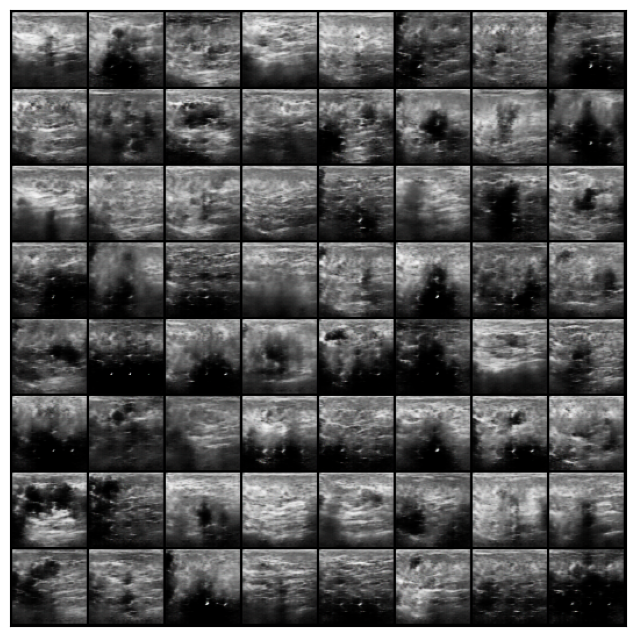

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [122/150], loss_g: 2.6087, loss_d: 0.4222, real_score: 0.7664, fake_score: 0.0921


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [123/150], loss_g: 4.9731, loss_d: 0.3135, real_score: 0.8708, fake_score: 0.1128


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [124/150], loss_g: 6.4138, loss_d: 0.1875, real_score: 0.9813, fake_score: 0.1457


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [125/150], loss_g: 5.7076, loss_d: 0.2287, real_score: 0.9553, fake_score: 0.1328


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [126/150], loss_g: 7.4822, loss_d: 0.2774, real_score: 0.9759, fake_score: 0.2012


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [127/150], loss_g: 3.2717, loss_d: 0.1288, real_score: 0.8982, fake_score: 0.0153


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [128/150], loss_g: 6.1941, loss_d: 0.0976, real_score: 0.9498, fake_score: 0.0425


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [129/150], loss_g: 5.3076, loss_d: 0.1061, real_score: 0.9544, fake_score: 0.0475


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [130/150], loss_g: 4.0520, loss_d: 0.1119, real_score: 0.9198, fake_score: 0.0247


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [131/150], loss_g: 4.2992, loss_d: 0.2511, real_score: 0.8219, fake_score: 0.0135
Saving generated-images-0131.png


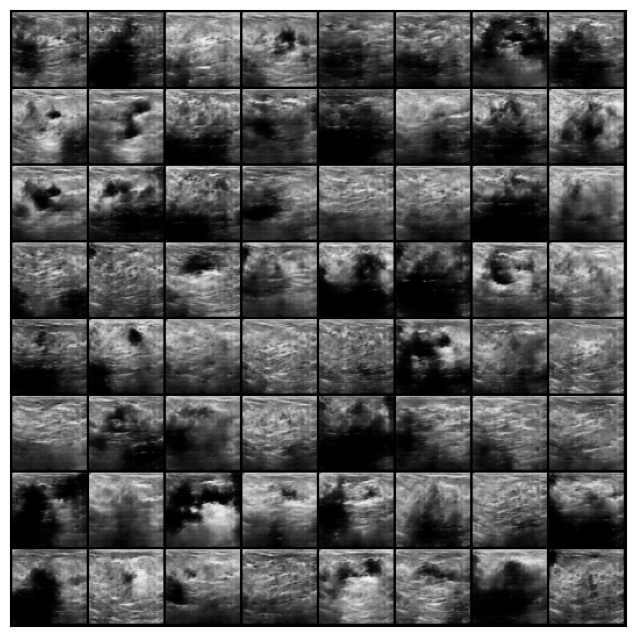

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [132/150], loss_g: 8.4614, loss_d: 0.2888, real_score: 0.9871, fake_score: 0.1981


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [133/150], loss_g: 3.6495, loss_d: 0.1401, real_score: 0.9012, fake_score: 0.0236


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [134/150], loss_g: 4.5104, loss_d: 0.1464, real_score: 0.8995, fake_score: 0.0290


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [135/150], loss_g: 4.7185, loss_d: 0.8699, real_score: 0.6607, fake_score: 0.0042


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [136/150], loss_g: 6.3670, loss_d: 0.1134, real_score: 0.9915, fake_score: 0.0925


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [137/150], loss_g: 4.8046, loss_d: 0.2073, real_score: 0.9064, fake_score: 0.0934


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [138/150], loss_g: 4.9749, loss_d: 0.0258, real_score: 0.9901, fake_score: 0.0155


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [139/150], loss_g: 1.3481, loss_d: 0.3464, real_score: 0.7741, fake_score: 0.0287


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [140/150], loss_g: 5.5293, loss_d: 0.1547, real_score: 0.9482, fake_score: 0.0866


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [141/150], loss_g: 5.5021, loss_d: 0.1576, real_score: 0.9439, fake_score: 0.0869
Saving generated-images-0141.png


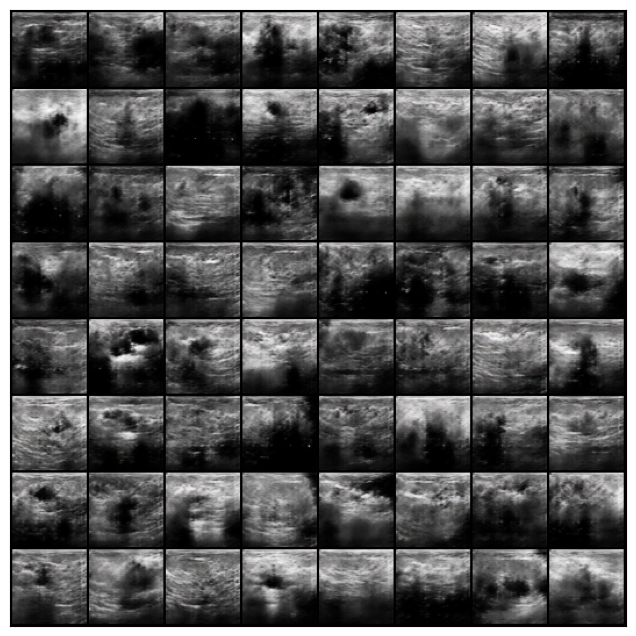

  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [142/150], loss_g: 5.7427, loss_d: 0.0653, real_score: 0.9910, fake_score: 0.0518


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [143/150], loss_g: 5.1844, loss_d: 0.0581, real_score: 0.9917, fake_score: 0.0458


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [144/150], loss_g: 4.9292, loss_d: 0.2890, real_score: 0.7839, fake_score: 0.0012


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [145/150], loss_g: 5.3688, loss_d: 0.0382, real_score: 0.9854, fake_score: 0.0226


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [146/150], loss_g: 5.3938, loss_d: 0.0362, real_score: 0.9832, fake_score: 0.0188


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [147/150], loss_g: 5.5061, loss_d: 0.0414, real_score: 0.9703, fake_score: 0.0105


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [148/150], loss_g: 2.8065, loss_d: 0.3879, real_score: 0.7675, fake_score: 0.0078


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [149/150], loss_g: 8.2729, loss_d: 0.4746, real_score: 0.9945, fake_score: 0.2698


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch [150/150], loss_g: 6.4626, loss_d: 0.1367, real_score: 0.8923, fake_score: 0.0130


In [37]:
generator = generator.to(device)
discriminator = discriminator.to(device)

class GANTrainer:
    def __init__(self, generator, discriminator, latent_size, train_dl, batch_size,
                 normal, device='cuda'):
        self.generator = generator
        self.discriminator = discriminator
        self.train_dl = train_dl
        self.device = device
        self.latent_size = latent_size
        self.fixed_latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    
    def denorm(self, img_tensors):
        return img_tensors * normal[1][0] + normal[0][0]

    def save_samples(self, index):
        latent_tensors = torch.randn(64, self.latent_size, 1, 1, device=self.device)
        fake_images = self.generator(latent_tensors)
        fake_fname = f'generated-images-{index:04d}.png'
        save_image(fake_images, os.path.join('/kaggle/working/', fake_fname), nrow=8)
        print('Saving', fake_fname)
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(self.denorm(fake_images.cpu().detach()), nrow=8).permute(1, 2, 0))
        plt.show()

    def train_discriminator(self, real_images, opt_d):
        opt_d.zero_grad()

        real_preds = self.discriminator(real_images)
        real_targets = torch.ones(real_images.size(0), 1, device=self.device)
        real_loss = F.binary_cross_entropy(real_preds, real_targets)
        real_score = torch.mean(real_preds).item()

        latent = torch.randn(real_images.size(0), self.latent_size, 1, 1, device=self.device)
        fake_images = self.generator(latent)

        fake_targets = torch.zeros(real_images.size(0), 1, device=self.device)
        fake_preds = self.discriminator(fake_images.detach())
        fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
        fake_score = torch.mean(fake_preds).item()

        loss = real_loss + fake_loss
        loss.backward()
        opt_d.step()

        return loss.item(), real_score, fake_score

    def train_generator(self, opt_g):
        opt_g.zero_grad()

        latent = torch.randn(self.train_dl.batch_size, self.latent_size, 1, 1,
                             device=self.device)
        fake_images = self.generator(latent)

        preds = self.discriminator(fake_images)
        targets = torch.ones(self.train_dl.batch_size, 1, device=self.device)
        loss = F.binary_cross_entropy(preds, targets)

        loss.backward()
        opt_g.step()

        return loss.item()

    def fit(self, epochs, lr, start_idx=1):
        torch.cuda.empty_cache()

        losses_g = []
        losses_d = []
        real_scores = []
        fake_scores = []

        opt_d = optim.Adam(self.discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
        opt_g = optim.Adam(self.generator.parameters(), lr=lr, betas=(0.5, 0.999))

        for epoch in range(epochs):
            for real_images in tqdm(self.train_dl):
                loss_d, real_score, fake_score = self.train_discriminator(real_images.to(self.device),
                                                                          opt_d)
                loss_g = self.train_generator(opt_g)

            losses_g.append(loss_g)
            losses_d.append(loss_d)
            real_scores.append(real_score)
            fake_scores.append(fake_score)

            print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}"
                  .format(
                epoch + 1, epochs, loss_g, loss_d, real_score, fake_score))
            
            if epoch % 10 == 0:
                # Save generated images
                self.save_samples(epoch + start_idx)

        return losses_g, losses_d, real_scores, fake_scores

trainer = GANTrainer(generator, discriminator, latent_size, dataloader_gan, batch_size, normal)
losses_g, losses_d, real_scores, fake_scores = trainer.fit(epochs=NUM_EPOCHS_GAN, lr=LR_GAN)

## 🍏 Save the Models and Plot Loss and Accuracy


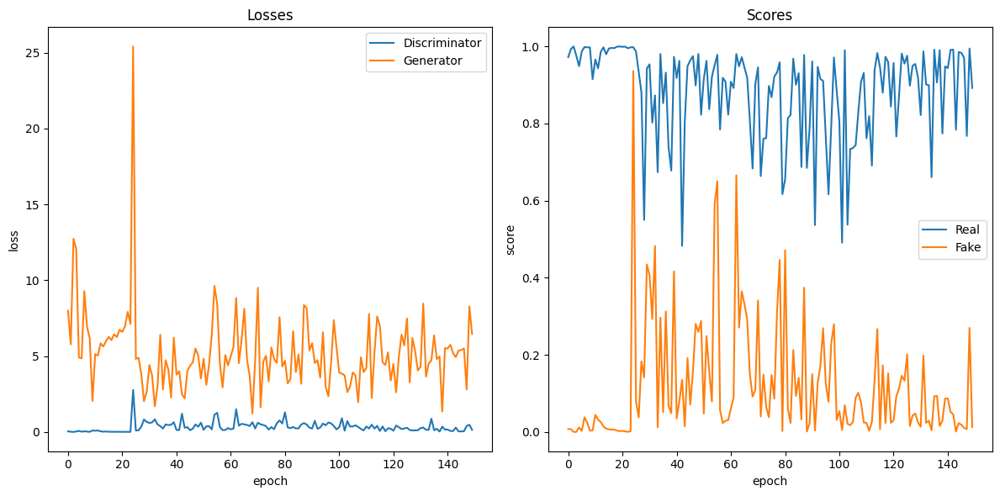

In [38]:
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

def plot_losses_and_scores(losses_d, losses_g, real_scores, fake_scores):
    # Plot losses
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(losses_d, '-')
    plt.plot(losses_g, '-')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Discriminator', 'Generator'])
    plt.title('Losses')

    # Plot scores
    plt.subplot(1, 2, 2)
    plt.plot(real_scores, '-')
    plt.plot(fake_scores, '-')
    plt.xlabel('epoch')
    plt.ylabel('score')
    plt.legend(['Real', 'Fake'])
    plt.title('Scores')

    plt.tight_layout()
    plt.show()
    
plot_losses_and_scores(losses_d, losses_g, real_scores, fake_scores)